## Temperature Forecast Project using ML

### Project Description

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

#### Attribute Information:

**For more information, read [Cho et al, 2020].**
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T


You have to build separate models that can predict the minimum temperature for the next day and the maximum temperature for the next day based on the details provided in the dataset.

### Dataset Link

https://github.com/dsrscientist/Dataset2/blob/main/temperature.csv

### Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

### Loading dataset

In [2]:
pd.set_option('display.max_columns', None)

df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


All columns except Date seem to be numerical. Based on the problem description, there are two target columns: Next_Tmin and Next_Tmax.<br>
Both these attributes are continuous, so both tasks are Regression type.

### Exploratory Data Analysis

In [3]:
# Getting dimensions of the dataset
df.shape

(7752, 25)

The dataset contains 7752 rows and 25 columns, out of which 2 columns are target or output variables.

In [4]:
# Getting the column names
df.columns.to_list()

['station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

The independent variables are:<br>
'station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation'<br>

The output or target variables are:<br>
'Next_Tmax',
 'Next_Tmin'

In [5]:
# Checking datatype of each column
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

Since all the variables except Date are numeric, the dataset float64 datatypes.<br>
The datatype of Date column is object and should be converted to datetime.

In [6]:
# Checking for null values
df.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

There are several missing values in the dataset. Removing the missing values for station, and Date would be prudent as there are only 2 missing values. Removing missing values for the target columns (Next_Tmax and Next_Tmin) is also necessary as they are target variables. For rest of the columns we may impute the values. All these will be handled during data preprocessing.

In [7]:
# Checking for duplicate values
df.duplicated().sum()

0

There are also no duplicate values in the dataset.

In [8]:
# Getting information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


This gives an overview of the dataset. From here, we can see that there are still missing values in the dataset. We can also observe the datatypes.<br>
From here, it is evident that we need to modify the datatype for Date column to datetime instead of object.

In [9]:
# Converting Date to datetime from object
df['Date'] = pd.to_datetime(df['Date'])

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

We can now see that the datatype for Date is datetime64 instead of object.

In [11]:
# Number of unique values for each variable
df.nunique()

station               25
Date                 310
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7672
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7675
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7569
LDAPS_CC2           7582
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            183
Next_Tmin            157
dtype: int64

There are 25 different stations and 310 different days for which the temperature has been measured.

In [12]:
# Numerical columns for data visualisation
num_cols = df.drop(columns=['Date'])
num_cols.columns.to_list()

['station',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

#### Dataset description

In [13]:
# Statistical summary of columns (numerical data)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7750.0,13.000000,7.211568,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7682.0,29.768211,2.969999,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7682.0,23.225059,2.413961,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7677.0,56.759372,14.668111,19.794666,45.963543,55.039024,67.190056,98.524734
LDAPS_RHmax,7677.0,88.374804,7.192004,58.936283,84.222862,89.793480,93.743629,100.000153
LDAPS_Tmax_lapse,7677.0,29.613447,2.947191,17.624954,27.673499,29.703426,31.710450,38.542255
LDAPS_Tmin_lapse,7677.0,23.512589,2.345347,14.272646,22.089739,23.760199,25.152909,29.619342
LDAPS_WS,7677.0,7.097875,2.183836,2.882580,5.678705,6.547470,8.032276,21.857621
LDAPS_LH,7677.0,62.505019,33.730589,-13.603212,37.266753,56.865482,84.223616,213.414006
LDAPS_CC1,7677.0,0.368774,0.262458,0.000000,0.146654,0.315697,0.575489,0.967277


Observations from the statistical summary:
- The mean is less than the median for Present_Tmax, Present_Tmin, LDAPS_RHmax, LDAPS_Tmax_lapse, LDAPS_Tmin_lapse, Solar radiation, Next_Tmax, Next_Tmin
- The mean is greater than the median for LDAPS_RHmin, LDAPS_WS, LDAPS_LH, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4, DEM, Slope
- Based on the 75% and max values, there seem to be several outliers as well.

#### Data Visualisation

In [14]:
# Setting uniform color palette
sns.set_palette(sns.color_palette("hls"))

##### Univariate analysis

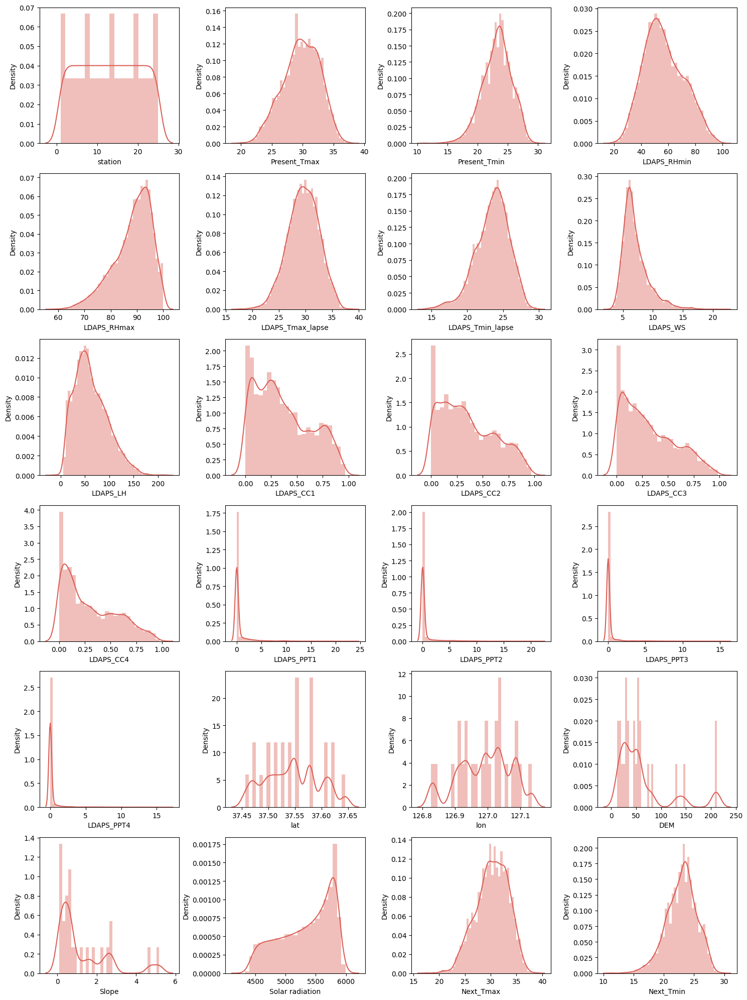

In [15]:
# Data distribution for numerical columns
plt.figure(figsize=(15, 20))
plot_num = 1
for col in num_cols:
    if plot_num <= 24:
        ax = plt.subplot(6, 4, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There is high skewness observed for LDAPS_RHmax, LDAPS_Tmin_lapse, LDAPS_WS, LDAPS_LH, LDAPS_CC3, LDAPS_CC4, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4, Slope, and Solar radiation.

##### Bivariate analysis

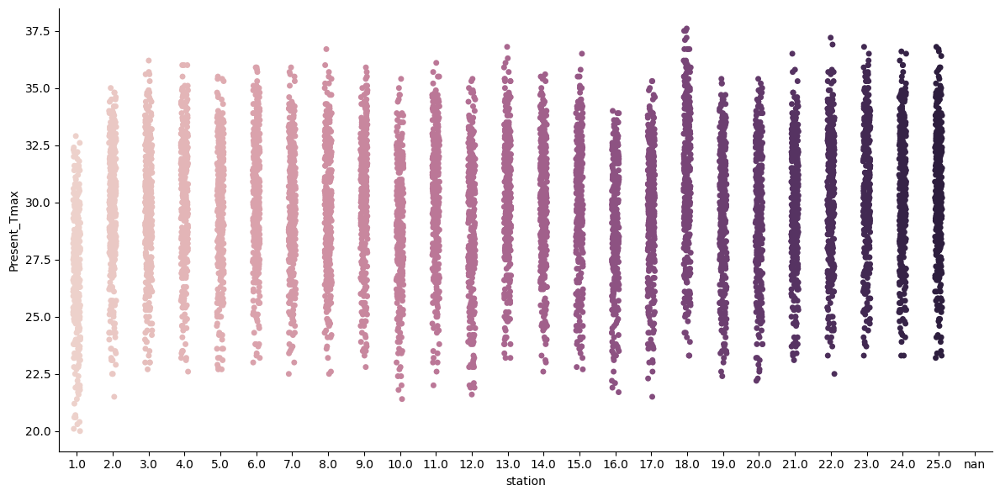

In [16]:
# Comparison between Present_Tmax and station
sns.catplot(x='station', y='Present_Tmax', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The station 18 seems to have the highest maximum temperature, while station 1 seems to have the lowest maximum temperature.

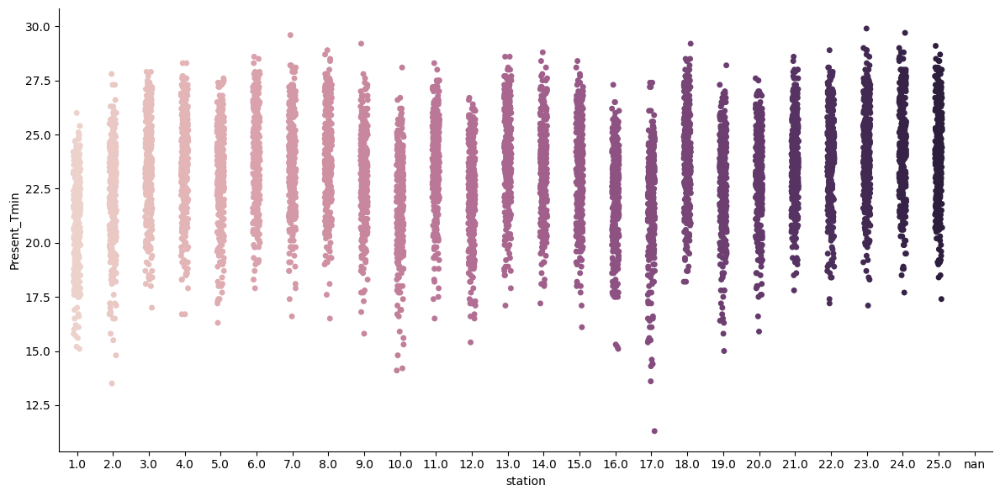

In [17]:
# Comparison between Present_Tmin and station
sns.catplot(x='station', y='Present_Tmin', hue='station', data=df, height=6, aspect=12/6)
plt.show()

Again, station 18 seems to have recorded highest minimum temperature, along with station 23, 24 and 25. Station 17 seems to have recorded the lowest minimum temparature.

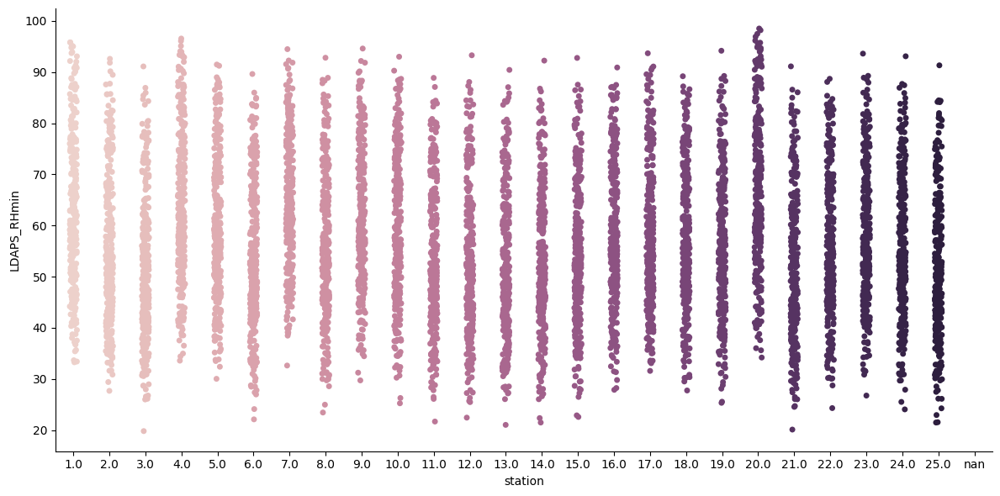

In [18]:
# Comparison between LDAPS_RHmin and station
sns.catplot(x='station', y='LDAPS_RHmin', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The station 20 seems to have the highest LDAPS_RHmin, while station 3 seems to have the lowest LDAPS_RHmin.

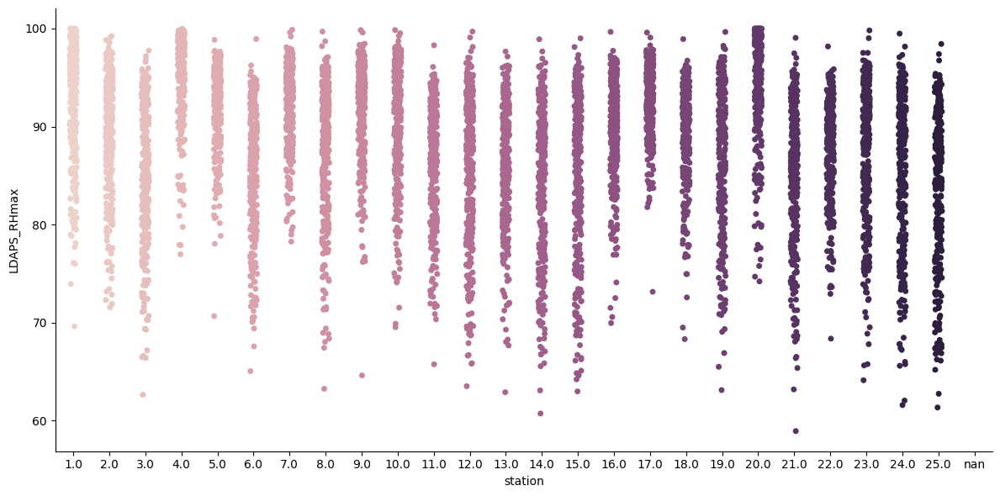

In [19]:
# Comparison between LDAPS_RHmax and station
sns.catplot(x='station', y='LDAPS_RHmax', hue='station', data=df, height=6, aspect=12/6)
plt.show()

Again, station 20 seems to have the highest LDAPS_RHmax, while station 21 seems to have recorded the lowest LDAPS_RHmax.

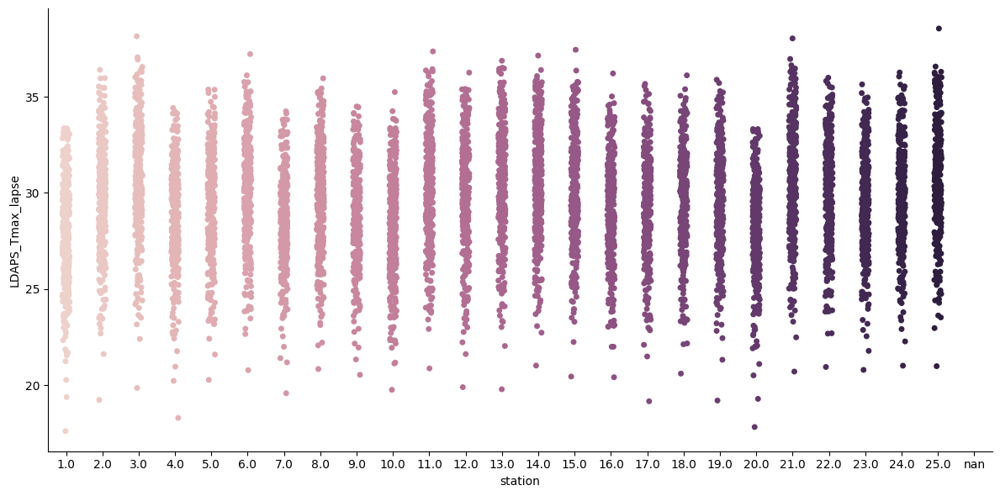

In [20]:
# Comparison between LDAPS_Tmax_lapse and station
sns.catplot(x='station', y='LDAPS_Tmax_lapse', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The stations 3 and 21 seem to have the highest LDAPS_Tmax_lapse, while station 1 and 20 seem to have the lowest LDAPS_Tmax_lapse.

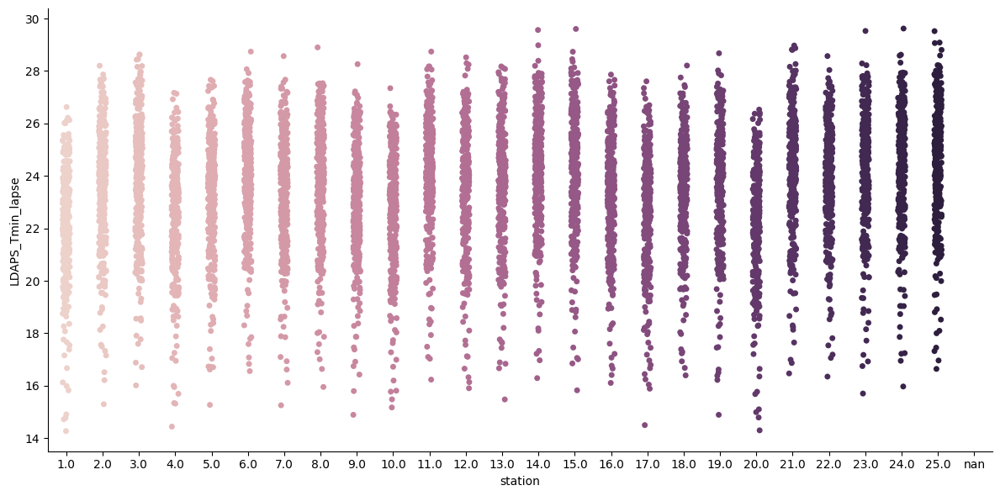

In [21]:
# Comparison between LDAPS_Tmin_lapse and station
sns.catplot(x='station', y='LDAPS_Tmin_lapse', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The stations 14, 15, 24 and 25 seem seem to have the highest LDAPS_Tmin_lapse, while stations 1, 4, 17 and 20 seem to have the lowest LDAPS_Tmin_lapse.

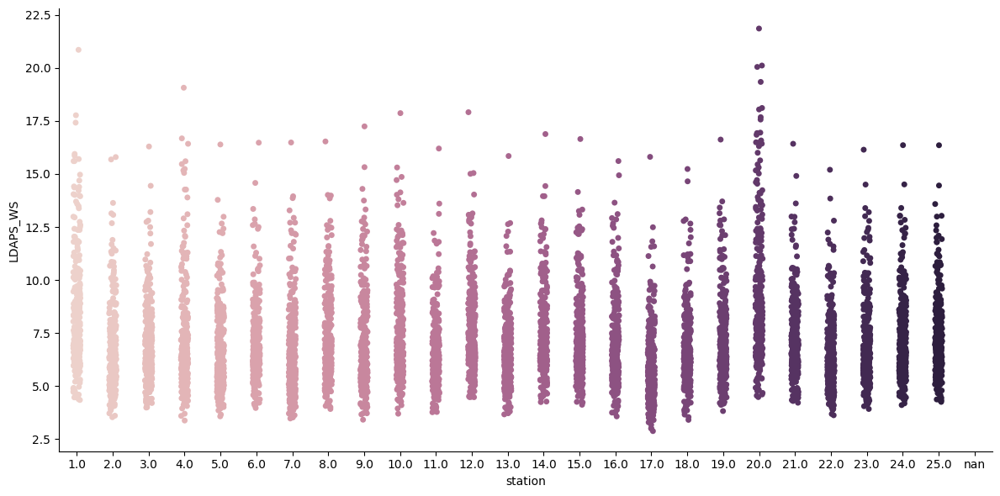

In [22]:
# Comparison between LDAPS_WS and station
sns.catplot(x='station', y='LDAPS_WS', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The station 20 seems to have the highest LDAPS_WS values, while station 17 seems to have the lowest LDAPS_WS.

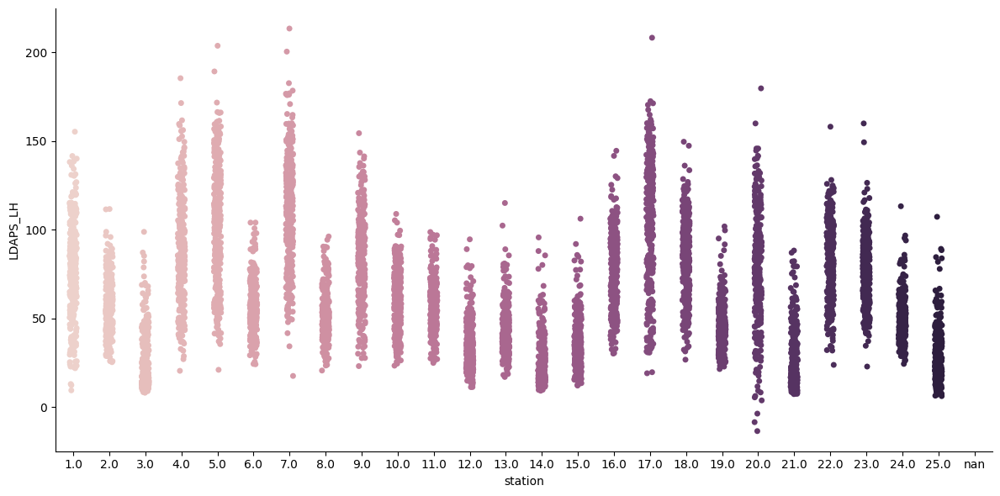

In [23]:
# Comparison between LDAPS_LH and station
sns.catplot(x='station', y='LDAPS_LH', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The station 7 seems to have the highest LDAPS_LH, while station 20 seems to have the lowest LDAPS_LH values.

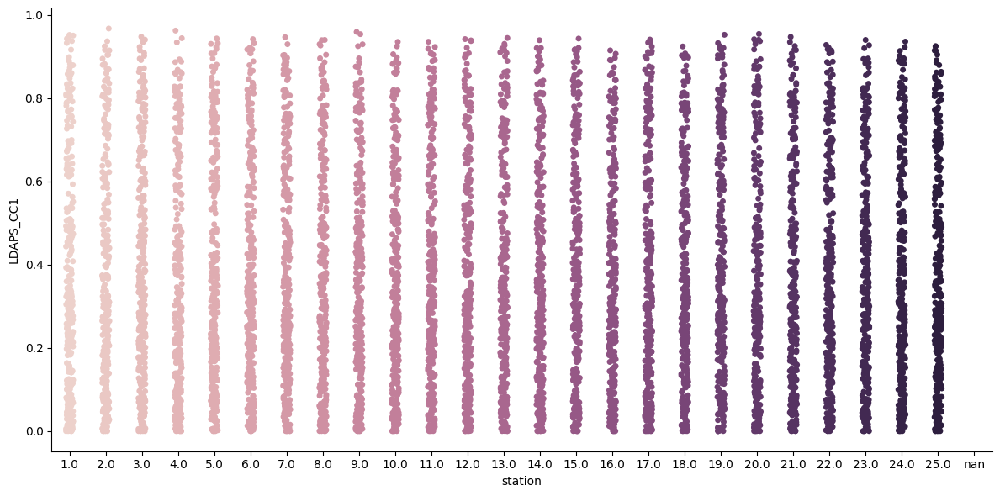

In [24]:
# Comparison between LDAPS_CC1 and station
sns.catplot(x='station', y='LDAPS_CC1', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The LDAPS_CC1 values do not seem to vary much between the stations.

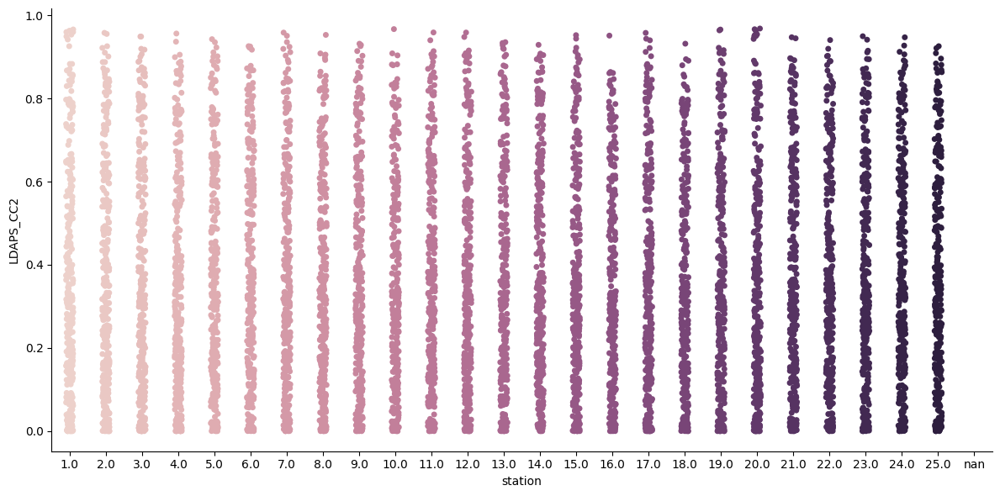

In [25]:
# Comparison between LDAPS_CC2 and station
sns.catplot(x='station', y='LDAPS_CC2', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The LDAPS_CC2 values also do not seem to vary much between the stations.

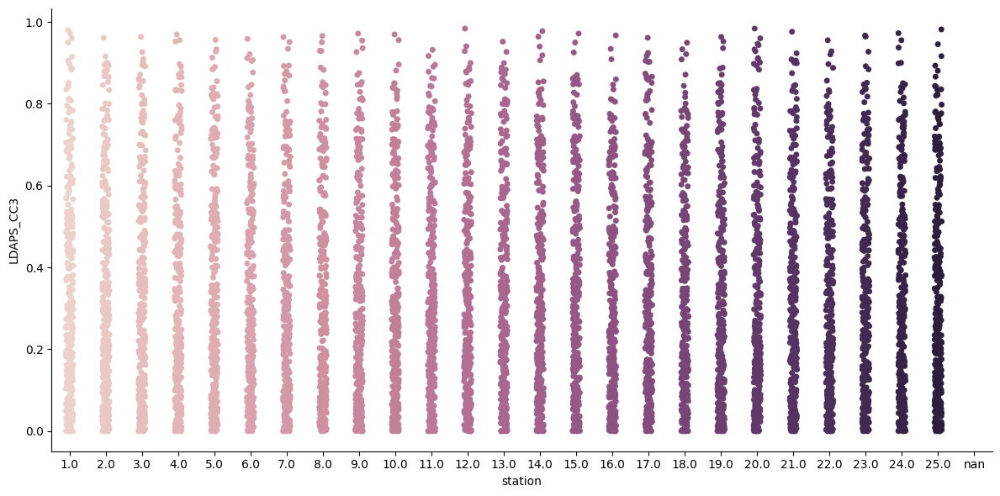

In [26]:
# Comparison between LDAPS_CC3 and station
sns.catplot(x='station', y='LDAPS_CC3', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The LDAPS_CC3 values seem to be similar for all stations.

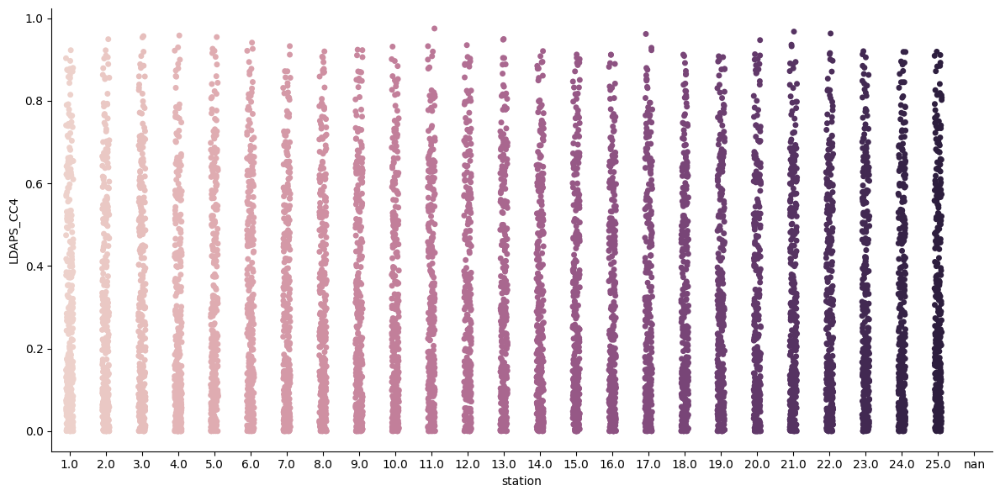

In [27]:
# Comparison between LDAPS_CC4 and station
sns.catplot(x='station', y='LDAPS_CC4', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The LDAPS_CC4 values also seem to be similar for all stations.

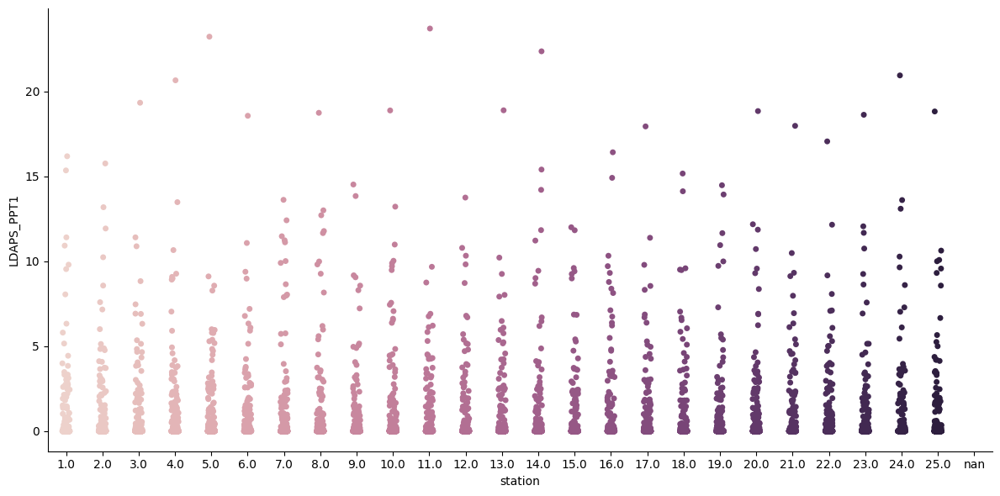

In [28]:
# Comparison between LDAPS_PPT1 and station
sns.catplot(x='station', y='LDAPS_PPT1', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The lowest values for LDAPS_PPT1 was almost same for all stations, while the highest value seems to be observed for station 11, followed by station 5.

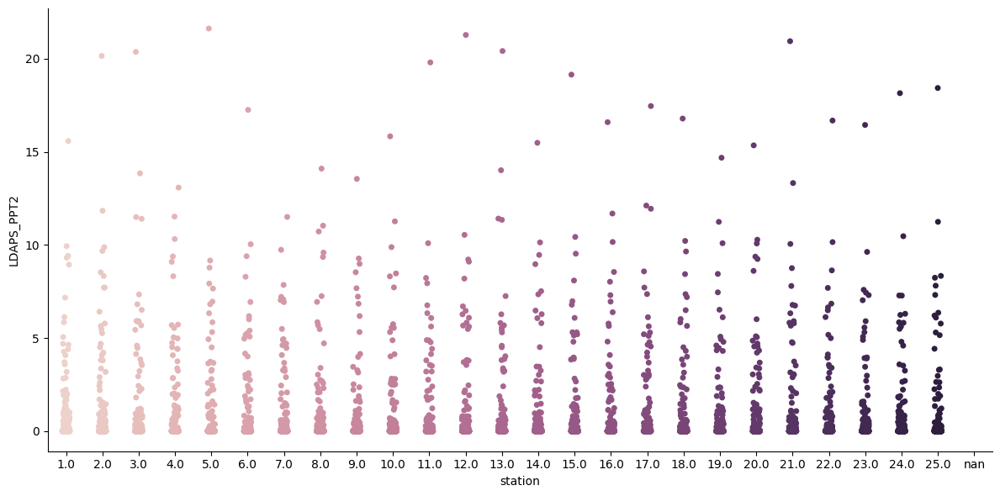

In [29]:
# Comparison between LDAPS_PPT2 and station
sns.catplot(x='station', y='LDAPS_PPT2', hue='station', data=df, height=6, aspect=12/6)
plt.show()

Again the lowest values observed for LDAPS_PPT2 was same for all stations, but the highest value of LDAPS_PPT2 was observed for station 5.

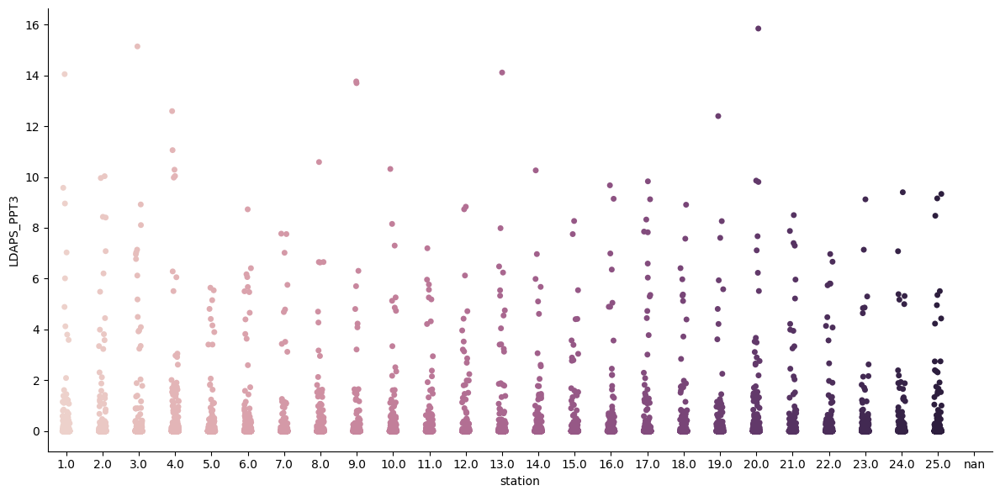

In [30]:
# Comparison between LDAPS_PPT3 and station
sns.catplot(x='station', y='LDAPS_PPT3', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The lowest LDAPS_PPT3 values seem to be similar for all stations, while the highest LDAPS_PPT3 value was recorded in station 20.

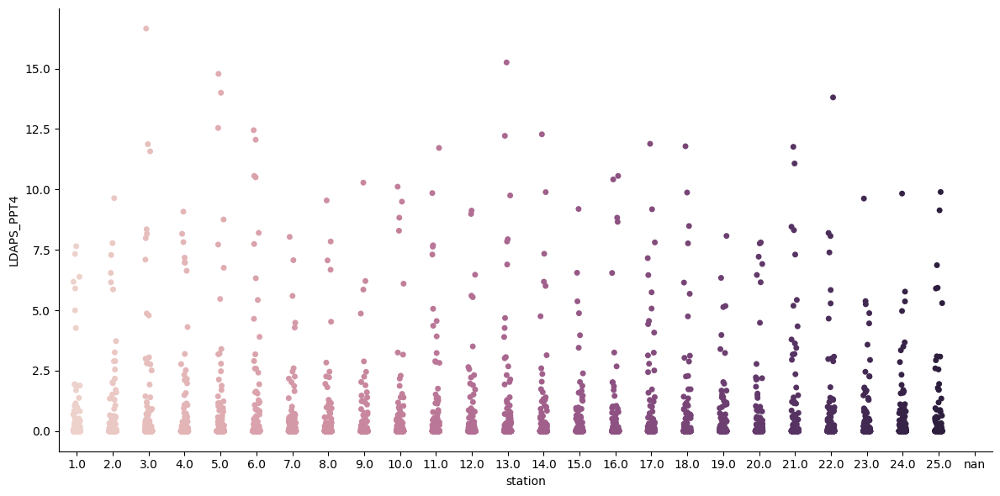

In [31]:
# Comparison between LDAPS_PPT4 and station
sns.catplot(x='station', y='LDAPS_PPT4', hue='station', data=df, height=6, aspect=12/6)
plt.show()

Again, the lowest LDAPS_PPT4 valus seem to be the same for all, but the highest LDAPS_PPT4 value was observed for station 3.

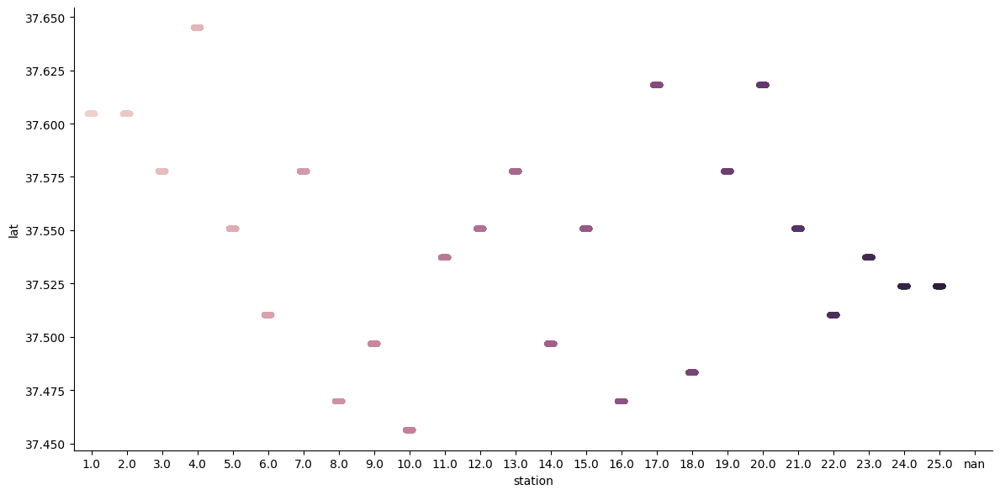

In [32]:
# Comparison between lat and station
sns.catplot(x='station', y='lat', hue='station', data=df, height=6, aspect=12/6)
plt.show()

This plot shows the latitude for each of the 25 stations. For instance stations 1 and 2 seem to be on the same latitude and so do stations 24 and 25.<br>
The lowest latitude observed is for station 10, which means it is the southernmost station, while the highest latitude is observed for station 4, meaning that it is the northernmost station. 

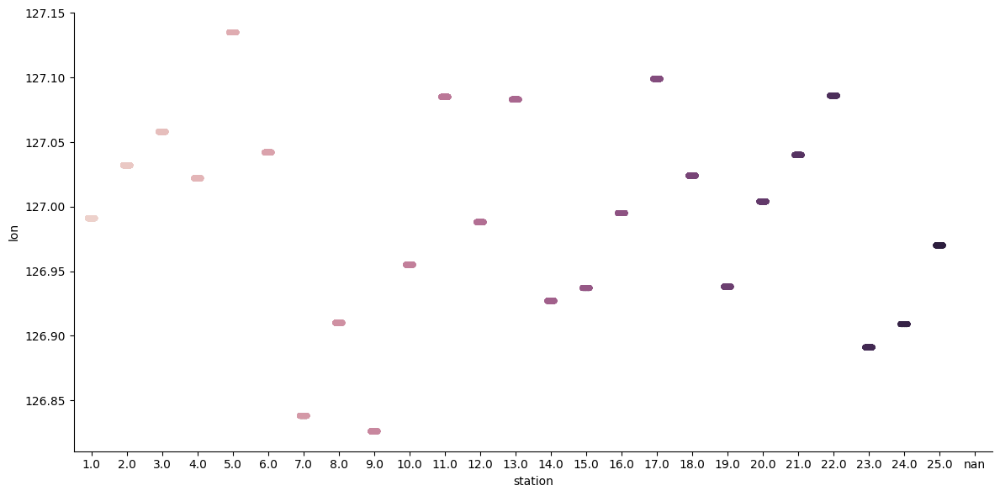

In [33]:
# Comparison between lon and station
sns.catplot(x='station', y='lon', hue='station', data=df, height=6, aspect=12/6)
plt.show()

This plot shows the longitude for each of the 25 stations. For instance stations 1 and 2 which were on the same latitude are on different longitudes and so do stations 24 and 25.<br>
The lowest longitude value observed is for station 9, indicating that it is the westernrnmost station, while the highest longitude is observed for station 5, meaning that it is the easternmost station.

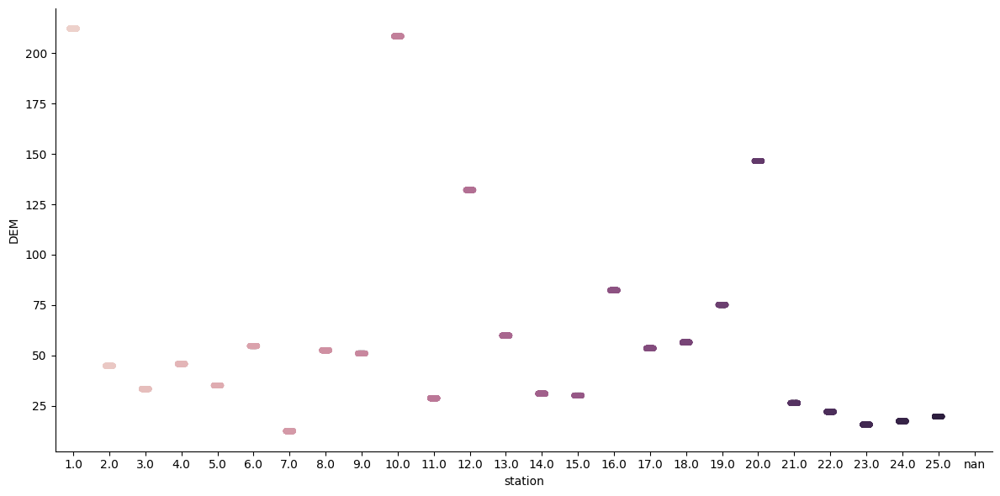

In [34]:
# Comparison between DEM and station
sns.catplot(x='station', y='DEM', hue='station', data=df, height=6, aspect=12/6)
plt.show()

This plot shows the elevation for each of the 25 stations. From the plot, we can see that station 1 has the highest elevation, followed by station 10. We can also see that station 7 has the lowest elevation.

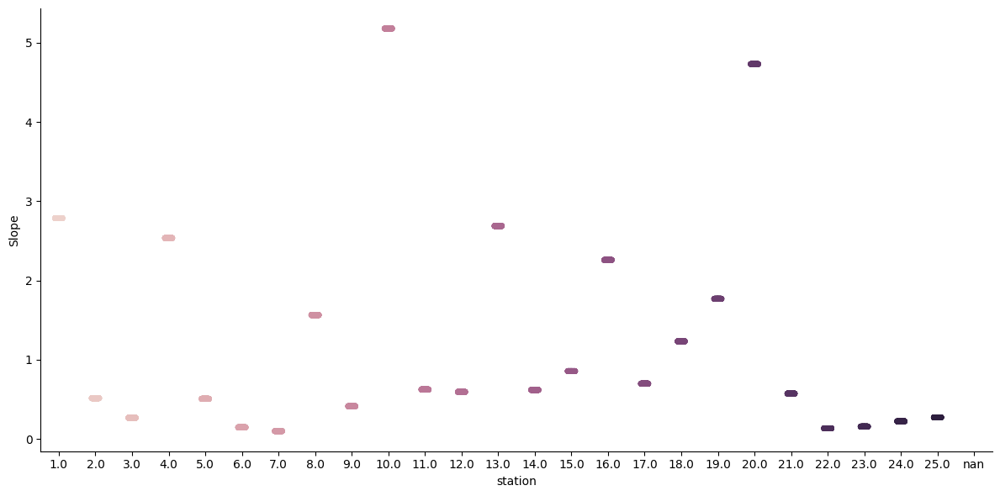

In [35]:
# Comparison between Slope and station
sns.catplot(x='station', y='Slope', hue='station', data=df, height=6, aspect=12/6)
plt.show()

This plot shows the Slope for all the stations. From the plot, we can see that station 10 has the highest slope, while station 7 has the lowest lowest slope.

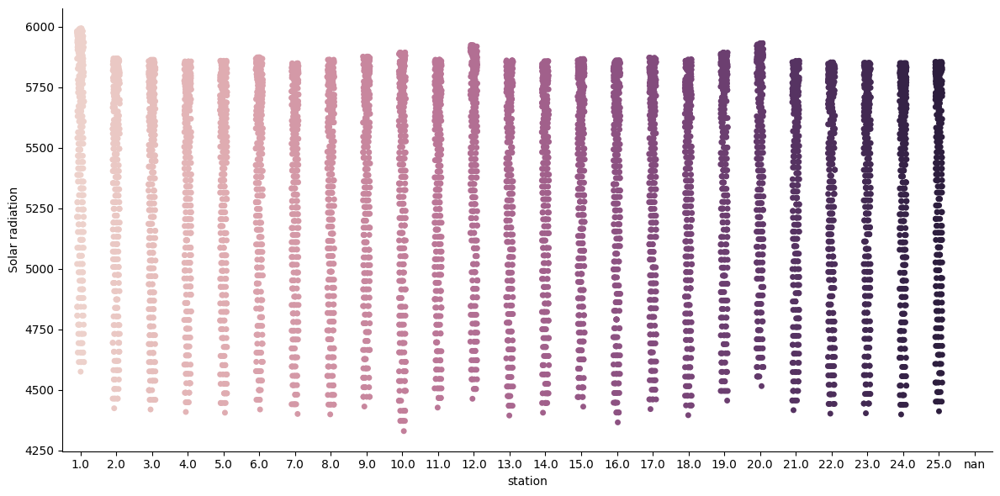

In [36]:
# Comparison between Solar radiation and station
sns.catplot(x='station', y='Solar radiation', hue='station', data=df, height=6, aspect=12/6)
plt.show()

From above we can observe that station 1 seems to have recorded the highest solar radiation, while station 10 seems to have recorded the lowest solar radiation.

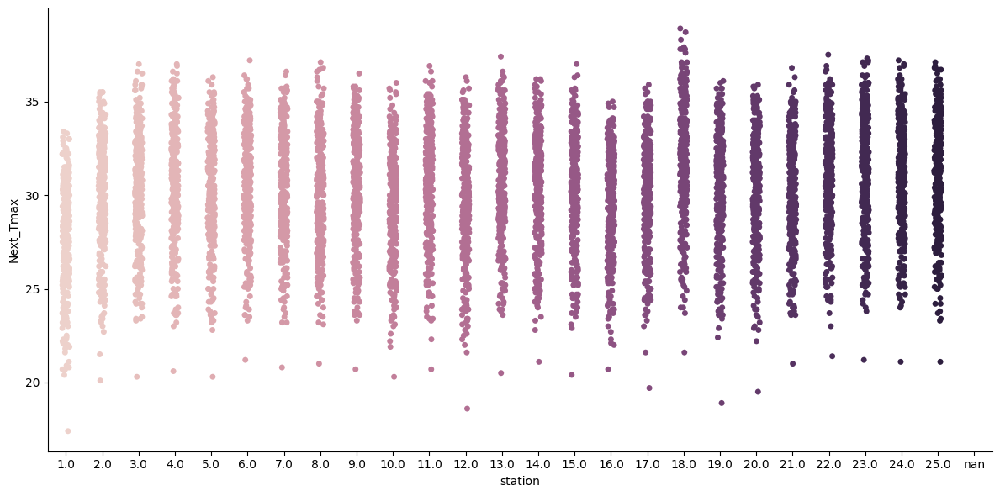

In [37]:
# Comparison between Next_Tmax and station
sns.catplot(x='station', y='Next_Tmax', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The station 18 seems to have the highest Next_Tmax, while station 1 seems to have the lowest.

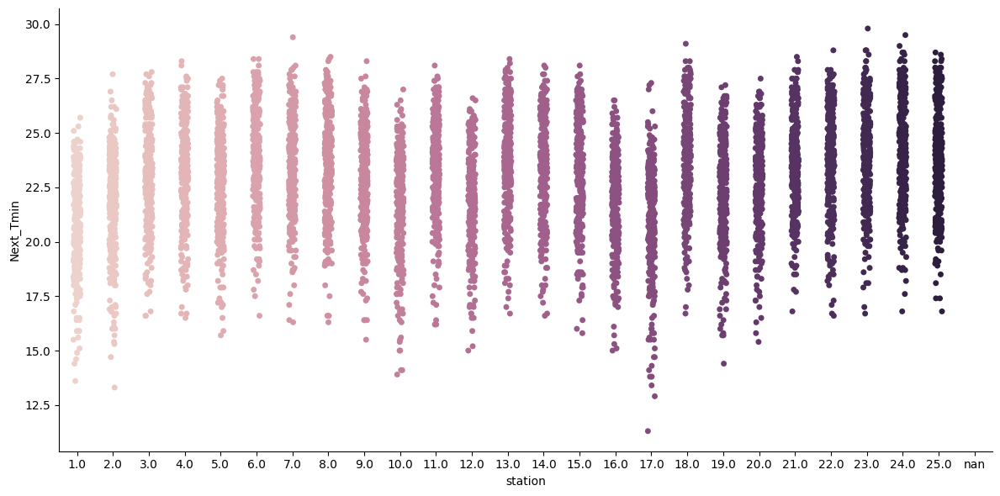

In [38]:
# Comparison between Next_Tmin and station
sns.catplot(x='station', y='Next_Tmin', hue='station', data=df, height=6, aspect=12/6)
plt.show()

The station 23 seems to have the highest Next_Tmin value, while station 17 seems to have the lowest.

##### Present day temperature vs Next day temperature

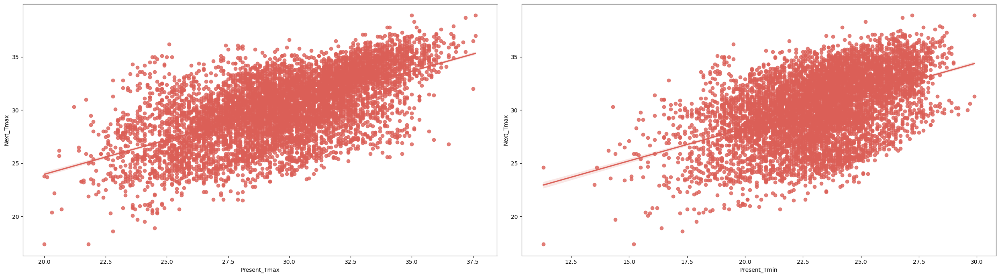

In [39]:
# Next_Tmax vs Present_Tmax and Present_Tmin
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Present_Tmax', 'Present_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmax', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

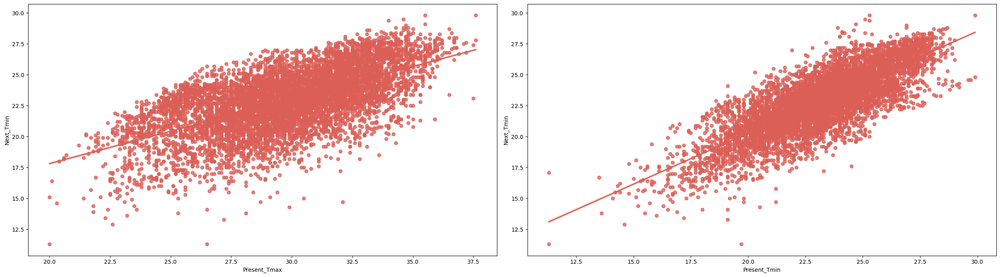

In [40]:
# Next_Tmin vs Present_Tmax and Present_Tmin
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Present_Tmax', 'Present_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmin', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There seems to be a strong linear relationship between present day temperature and next day temperature (both maximum and minimum).<br>
With increase in Present_Tmax and Present_Tmin, Next_Tmax and Next_Tmin values are seen to increase.

##### Next day relative humidity vs Next day temperature

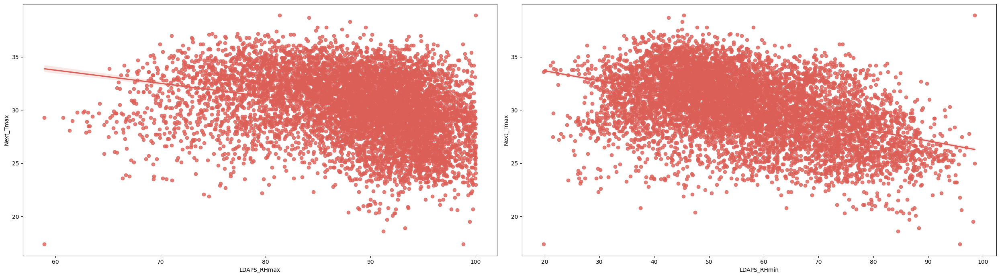

In [41]:
# Next_Tmax vs LDAPS_RHmax and LDAPS_RHmin
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['LDAPS_RHmax', 'LDAPS_RHmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmax', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

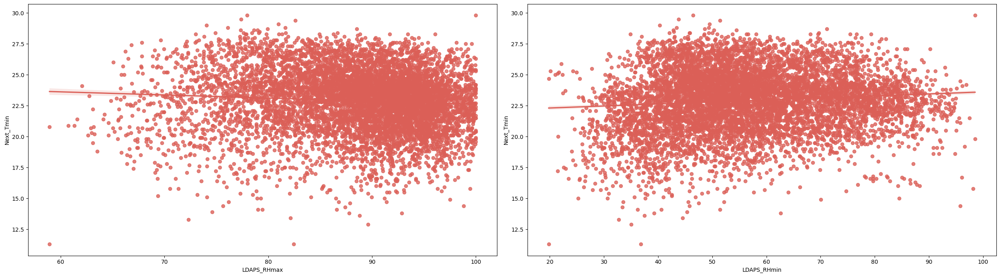

In [42]:
# Next_Tmin vs LDAPS_RHmax and LDAPS_RHmin
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['LDAPS_RHmax', 'LDAPS_RHmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmin', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There relationship between the next day RH forcast (LDAPS_RHmax and LDAPS_RHmin) and next day temperatures (max and min) seem to be a little weak, especially with Next_Tmin.<br>
Next_Tmax has a negative relationship with both LDAPS_RHmax and LDAPS_RHmin and decreases with increase in the forecasted RH values.<br>
Next_Tmin has a very very weak negative relationship with LDAPS_RHmax and a slightly positive relationship with LDAPS_RHmin

##### Next day air temperature lapse rate vs Next day temperature

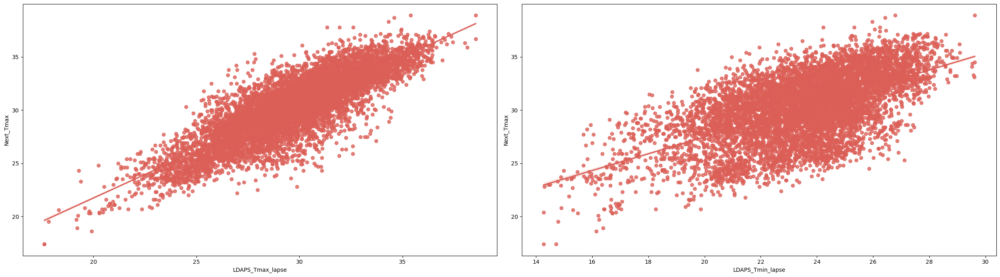

In [43]:
# Next_Tmax vs LDAPS_Tmax_lapse and LDAPS_Tmin_lapse
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmax', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

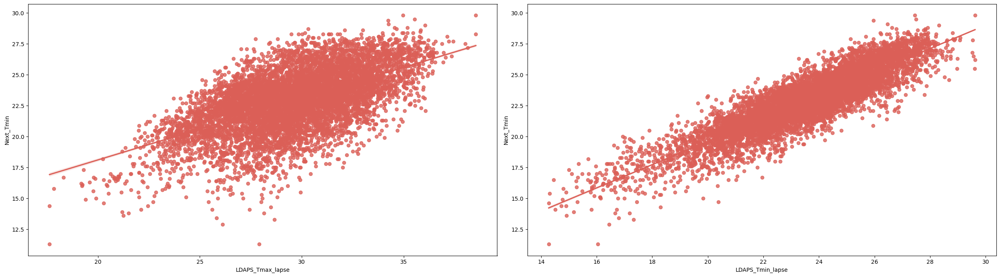

In [44]:
# Next_Tmin vs LDAPS_Tmax_lapse and LDAPS_Tmin_lapse
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmin', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There relationship between the next day air temperature lapse rate forecast (LDAPS_Tmax_lapse and LDAPS_Tmin_lapse) and next day temperatures (Next_Tmax and Next_Tmin) seem to be very strong, especially between Next_Tmax and LDAPS_Tmax_lapse and between Next_Tmin and LDAPS_Tmin_lapse.<br>
All reltionships are positive, indicating with increase in temperature there is an increase in air temperature lapse rate.

##### Next day wind speed vs Next day temperature

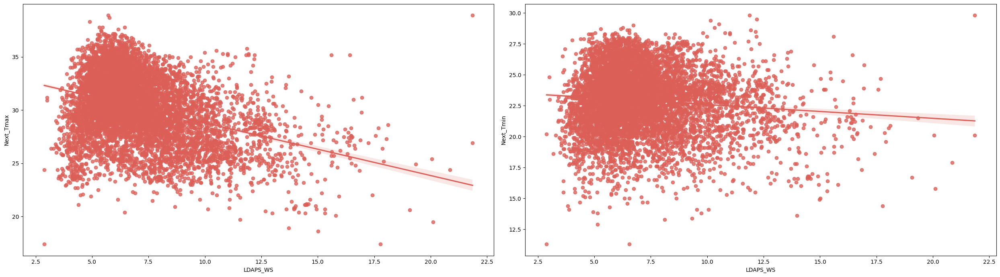

In [45]:
# Next_Tmax and Next_Tmin vs LDAPS_WS
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Next_Tmax', 'Next_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x='LDAPS_WS', y=col, data=df)
        plt.xlabel('LDAPS_WS', fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There seems to be a negative relationship between LDAPS_WS and next day temperatures. The relationship seems to me weaker with Next_Tmin than Next_Tmax.

##### Next day latent heat flux vs Next day temperature

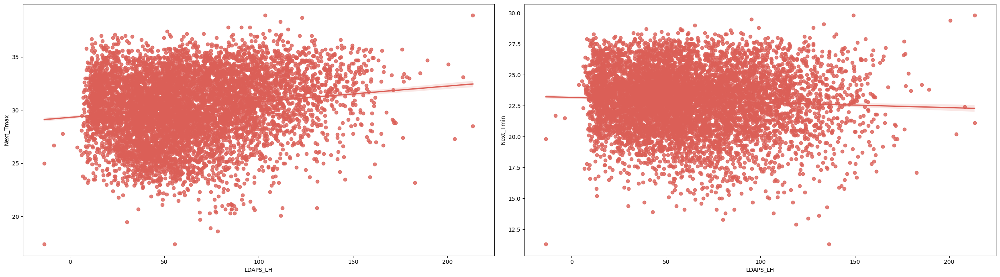

In [46]:
# Next_Tmax and Next_Tmin vs LDAPS_LH
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Next_Tmax', 'Next_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x='LDAPS_LH', y=col, data=df)
        plt.xlabel('LDAPS_LH', fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There relationship between the next day average latent heat flux forecast and next day temperatures (Next_Tmax and Next_Tmin) seem to be quite weak.<br>
The relationship between LDAPS_LH and Next_Tmax is positive, while that between LDAPS_LH and Next_Tmin is negative.

##### Next day cloud cover vs Next day temperature

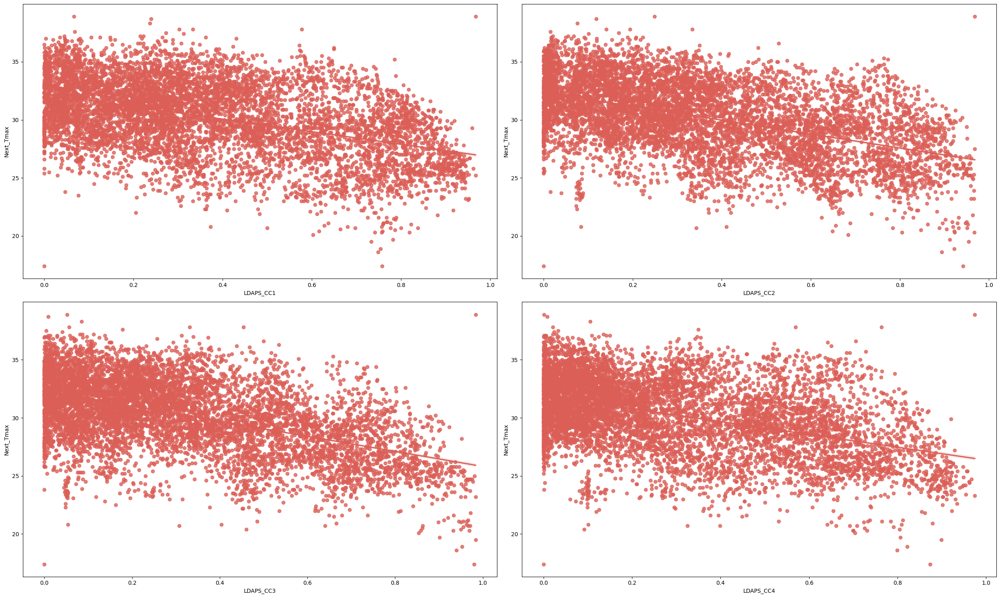

In [47]:
# Next_Tmax vs LDAPS_CC1, LDAPS_CC2, LDAPS_CC3 and LDAPS_CC4
plt.figure(figsize=(25, 15))
plot_num = 1
for col in ['LDAPS_CC1','LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']:
    if plot_num <= 4:
        ax = plt.subplot(2, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmax', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

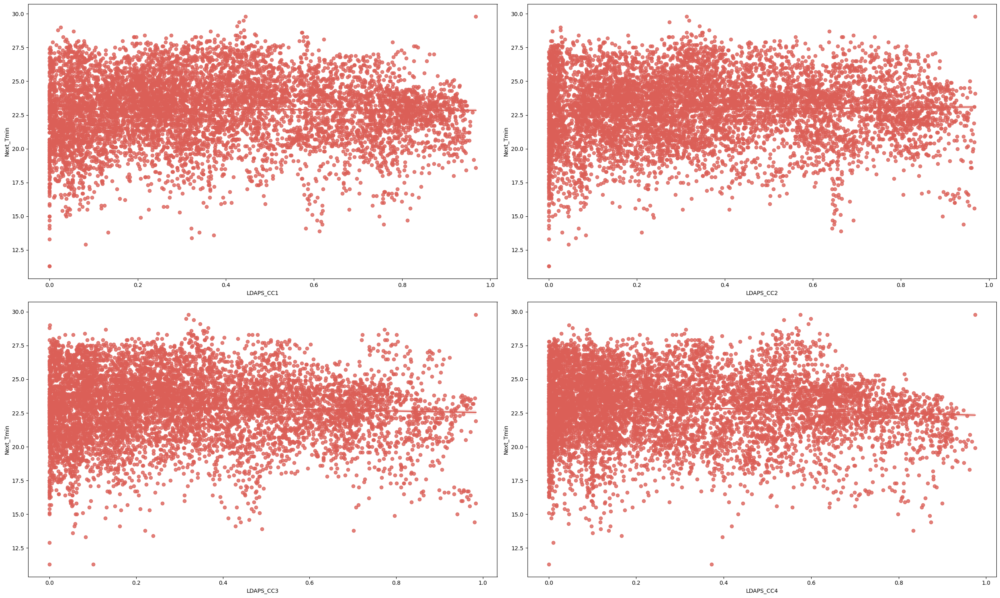

In [48]:
# Next_Tmin vs LDAPS_CC1, LDAPS_CC2, LDAPS_CC3 and LDAPS_CC4
plt.figure(figsize=(25, 15))
plot_num = 1
for col in ['LDAPS_CC1','LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']:
    if plot_num <= 4:
        ax = plt.subplot(2, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmin', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There seems to be no linear relationship between cloud cover and next day temperatures (both maximum and minimum).<br>

##### Next day precipitation vs Next day temperature

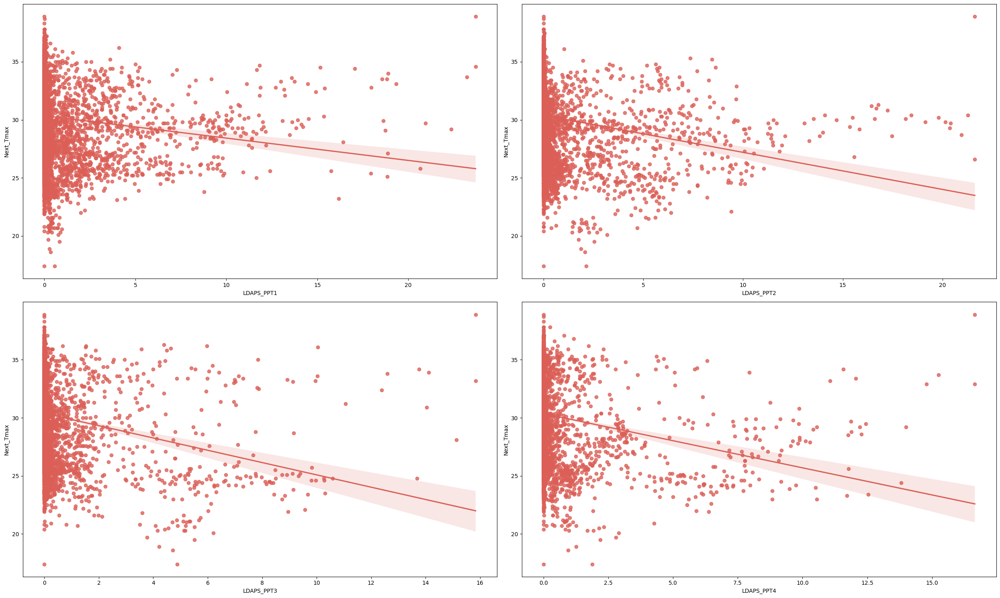

In [49]:
# Next_Tmax vs LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4
plt.figure(figsize=(25, 15))
plot_num = 1
for col in ['LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']:
    if plot_num <= 4:
        ax = plt.subplot(2, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmax', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

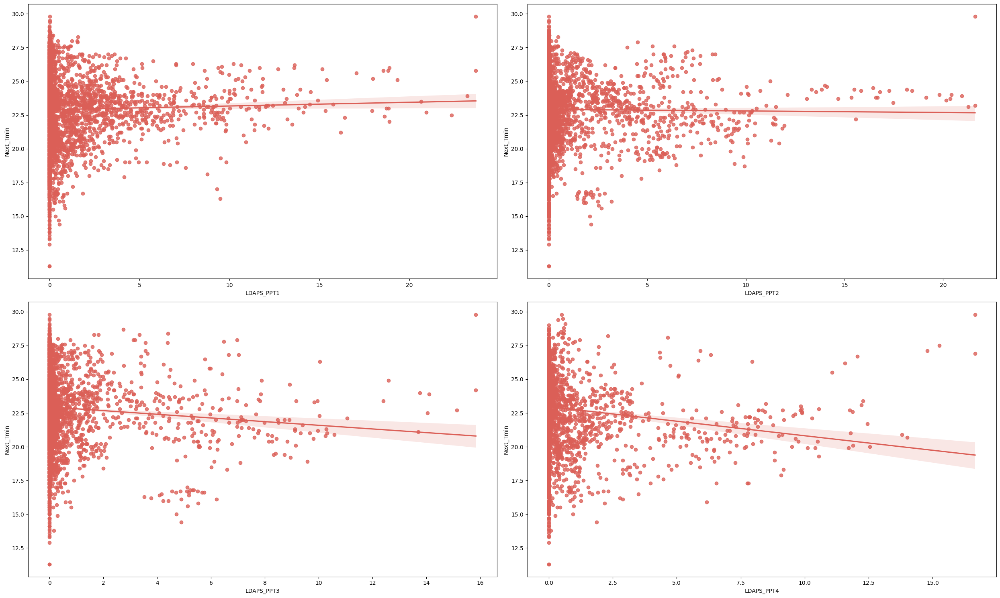

In [50]:
# Next_Tmin vs LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4
plt.figure(figsize=(25, 15))
plot_num = 1
for col in ['LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']:
    if plot_num <= 4:
        ax = plt.subplot(2, 2, plot_num)
        sns.regplot(x=col, y='Next_Tmin', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There seems to be a weak negative linear relationship between precipitation and next day maximum temperatures, that signify temperature decrease with increase in precipitation<br>
The relationship between Next_Tmin and LDAPS_PPTx seem to be weaker than Next_Tmax and LDAPS_PPTx. Next_Tmin and LDAPS_PPT1 seem to have a slightly positive relationship.

##### Latitude & Longitude vs Next day temperature

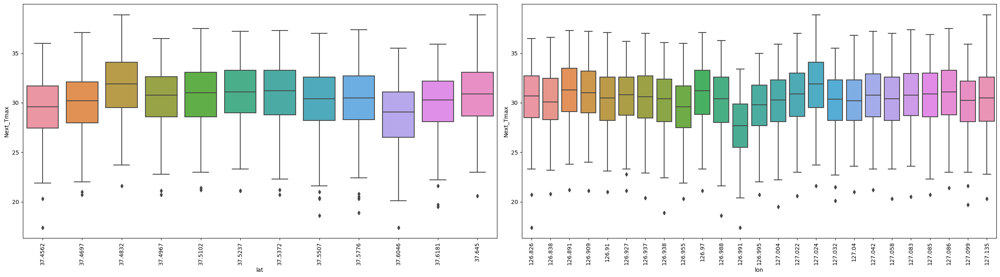

In [51]:
# Next_Tmax vs lat and lon
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['lat', 'lon']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.boxplot(x=col, y='Next_Tmax', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
        plt.xticks(rotation = 90, fontsize = 10)
    plot_num+=1
plt.tight_layout()

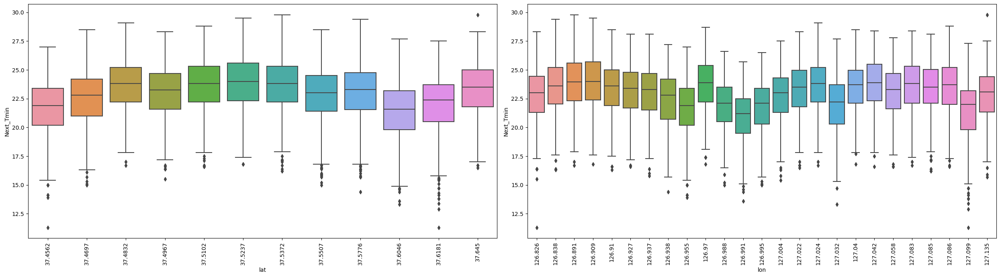

In [52]:
# Next_Tmin vs lat and lon
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['lat', 'lon']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.boxplot(x=col, y='Next_Tmin', data=df)
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
        plt.xticks(rotation = 90, fontsize = 10)
    plot_num+=1
plt.tight_layout()

The highest maximum next day temperature is observed for latitude value 37.4832 degree, and longitude value around 127.024 degree, while the lowest maximum next day temperature is observed for latitude value 37.4562 as well as 37.6046 degree, and longitude value around 126.826 as well as 126.991 degree<br>
The highest minimum next day temperature is observed at 37.5372 degree latitude value and at 126.891 degree longitude, and the lowest minimum next day temperature is observed for 37.4562 and 37.6181 degree latitude value and 126.826 and 127.099 degree longitude values.

##### Elevation vs Next day temperature

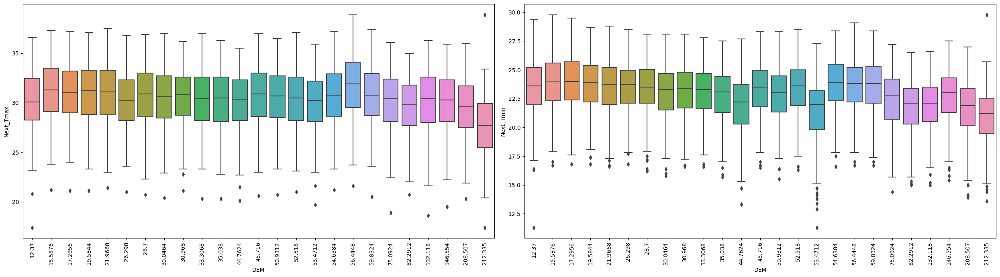

In [53]:
# Next_Tmax and Next_Tmin vs DEM
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Next_Tmax', 'Next_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.boxplot(x='DEM', y=col, data=df)
        plt.xlabel('DEM', fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
        plt.xticks(rotation = 90, fontsize = 10)
    plot_num+=1
plt.tight_layout()

The highest Next_Tmax is observed for elevation 56.4448m, while the lowest is observed for elevation 12.37m and 212.335m.<br>
The highest Next_Tmin is observed for elevation 15.5876m, while the lowest is observed for elevation 12.37m and 53.4712m.

##### Slope vs Next day temperature

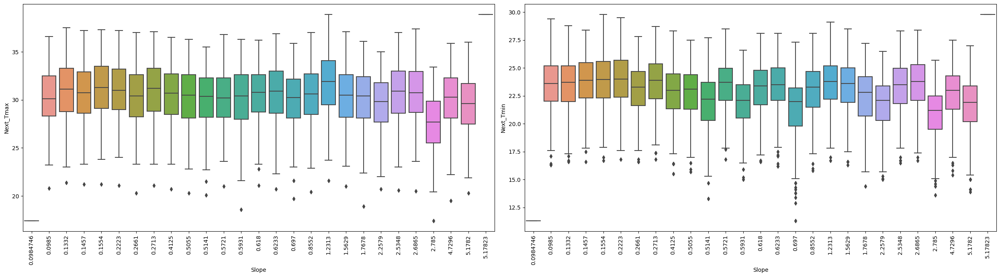

In [54]:
# Next_Tmax and Next_Tmin vs Slope
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Next_Tmax', 'Next_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.boxplot(x='Slope', y=col, data=df)
        plt.xlabel('Slope', fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
        plt.xticks(rotation = 90, fontsize = 10)
    plot_num+=1
plt.tight_layout()

The highest maximum next day temperature is observed for slope value 1.2313, while the lowest maximum next day temperature is observed for slope 2.785<br>
The highest minimum next day temperature is observed at slope of 0.1554 , while the lowest minimum next day temperature is observed for slope 0.697

##### Solar radiation vs Next day temperature

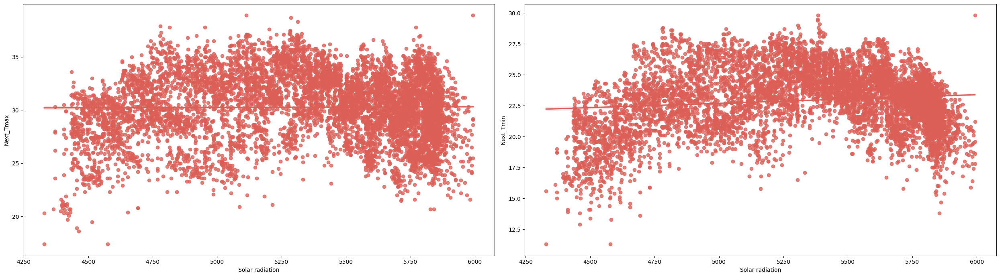

In [55]:
# Next_Tmax and Next_Tmin vs Solar radiation
plt.figure(figsize=(25, 7))
plot_num = 1
for col in ['Next_Tmax', 'Next_Tmin']:
    if plot_num <= 2:
        ax = plt.subplot(1, 2, plot_num)
        sns.regplot(x='Solar radiation', y=col, data=df)
        plt.xlabel('Solar radiation', fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There seems to be no significant relationship between Solar radiation and next day temperatures, both max and min.

### Data preprocessing

#### Removing rows

In [56]:
# Removing rows where station and date has missing values
df.dropna(subset=['station', 'Date'], inplace=True)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,1.616969e-01,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,1.594441e-01,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,2.040915e-01,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,1.611574e-01,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,1.788925e-01,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,0.030169,0.000000e+00,0.004380,0.0,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,0.024518,5.850000e-07,0.017678,0.0,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [57]:
df.isna().sum()

station              0
Date                 0
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

We also need to remove na values from Next_Tmax and Next_Tmin. Since, we are predicting Next_Tmax and Next_Tmin, we should not impute or modify these variables.

In [58]:
# Removing rows where station and date has missing values
df.dropna(subset=['Next_Tmax', 'Next_Tmin'], inplace=True)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,1.616969e-01,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,1.594441e-01,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,2.040915e-01,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,1.611574e-01,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,1.788925e-01,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,0.030169,0.000000e+00,0.004380,0.0,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,0.024518,5.850000e-07,0.017678,0.0,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [59]:
df.isna().sum()

station              0
Date                 0
Present_Tmax        60
Present_Tmin        60
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax            0
Next_Tmin            0
dtype: int64

Now, we will proceed with imputation for remaining columns

#### Imputation

For variables with mean value close to the median, we can perform mean imputation. For variables with hige difference between mean and median (greater skewness), we will perform median imputaton.<br>
For this, we can first check the skewness of the variables. For high skewness, we will perform imputation with median values and for low skewness we will perform imputation with mean values

In [60]:
df.skew()

station            -0.002773
Present_Tmax       -0.262612
Present_Tmin       -0.355159
LDAPS_RHmin         0.301532
LDAPS_RHmax        -0.845614
LDAPS_Tmax_lapse   -0.222652
LDAPS_Tmin_lapse   -0.575089
LDAPS_WS            1.550978
LDAPS_LH            0.663598
LDAPS_CC1           0.458080
LDAPS_CC2           0.472555
LDAPS_CC3           0.638484
LDAPS_CC4           0.662400
LDAPS_PPT1          5.303822
LDAPS_PPT2          5.692702
LDAPS_PPT3          6.348470
LDAPS_PPT4          6.718651
lat                 0.086467
lon                -0.286647
DEM                 1.721745
Slope               1.560876
Solar radiation    -0.513584
Next_Tmax          -0.335372
Next_Tmin          -0.396184
dtype: float64

Variables with low skewness:
- Present_Tmax
- Present_Tmin
- LDAPS_RHmin
- LDAPS_Tmax_lapse
- LDAPS_CC1
- LDAPS_CC2<br>

Variables with high skewness:
- LDAPS_RHmax
- LDAPS_Tmin_lapse
- LDAPS_WS
- LDAPS_LH
- LDAPS_CC3
- LDAPS_CC4
- LDAPS_PPT1
- LDAPS_PPT2
- LDAPS_PPT3
- LDAPS_PPT4

##### Mean imputation

In [61]:
# Filling missing values using mean imputation 
cols = ["Present_Tmax", "Present_Tmin", "LDAPS_RHmin", "LDAPS_Tmax_lapse", "LDAPS_CC1", "LDAPS_CC2"]

for col in cols:
    df[col] = df[col].fillna(df[col].mean())

##### Median imputation

In [62]:
# Filling missing values using median imputation 
cols= ["LDAPS_RHmax", "LDAPS_Tmin_lapse", "LDAPS_WS", "LDAPS_LH", "LDAPS_CC3", "LDAPS_CC4", "LDAPS_PPT1", "LDAPS_PPT2", "LDAPS_PPT3", "LDAPS_PPT4"]

for col in cols:
    df[col] = df[col].fillna(df[col].median())

In [63]:
df.isna().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

There are no missing values in the dataset now.

#### Feature engineering

The LDAPS cloud cover values (LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, and LDAPS_CC4) are highly correlated with each other. So are the LDAPS precipitation values (LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, and LDAPS_PPT1)

In [64]:
# Taking average of Cloud Cover and Precipitation values (to avoid multicollinearity)
df['LDAPS_CC'] = df.apply(lambda x: (x.LDAPS_CC1 + x.LDAPS_CC2 + x.LDAPS_CC3+ x.LDAPS_CC4)/4, axis=1)
df['LDAPS_PPT'] = df.apply(lambda x: (x.LDAPS_PPT1 + x.LDAPS_PPT2 + x.LDAPS_PPT3+ x.LDAPS_PPT4)/4, axis=1)
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,LDAPS_CC,LDAPS_PPT
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,0.182617,0.0
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,0.191113,0.0
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,0.203257,0.0
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,0.184445,0.0
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,0.187579,0.0


In [65]:
# Dropping the extra columns
df.drop(columns=['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4'], inplace=True)
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,LDAPS_CC,LDAPS_PPT
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,0.182617,0.0
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,0.191113,0.0
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,0.203257,0.0
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,0.184445,0.0
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,0.187579,0.0


In [66]:
# Checking the dimension of the dataset
df.shape

(7723, 19)

There are 7723 rows and 19 columns now in the dataset.

In [67]:
num_cols = df.drop(columns=['Date'])
num_cols.columns.to_list()

['station',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin',
 'LDAPS_CC',
 'LDAPS_PPT']

##### Data distribution

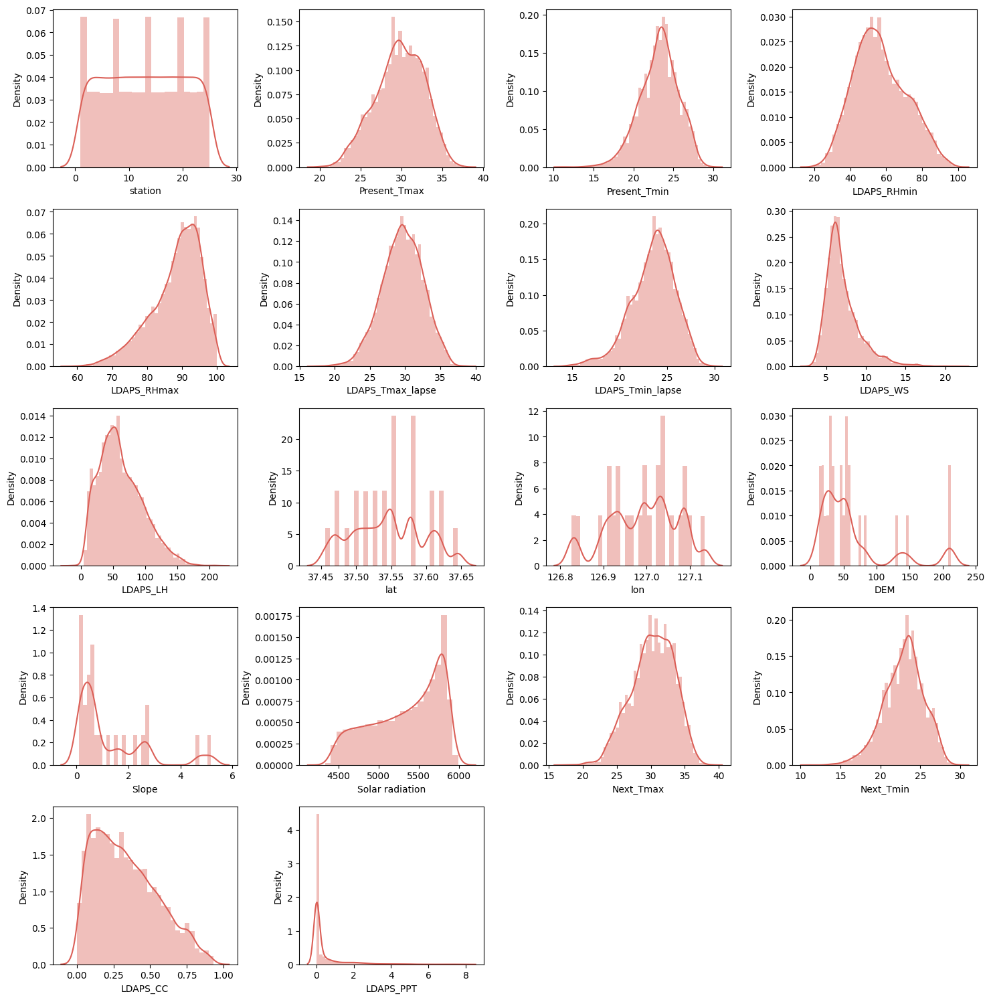

In [68]:
# Data distribution
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 18:
        ax = plt.subplot(5, 4, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

LDAPS_RHmax, LDAPS_WS, LDAPS_LH, DEM, Slope, Solar radiation, LDAPS_CC, and LDAPS_PPT all high skewness.

### Checking for outliers

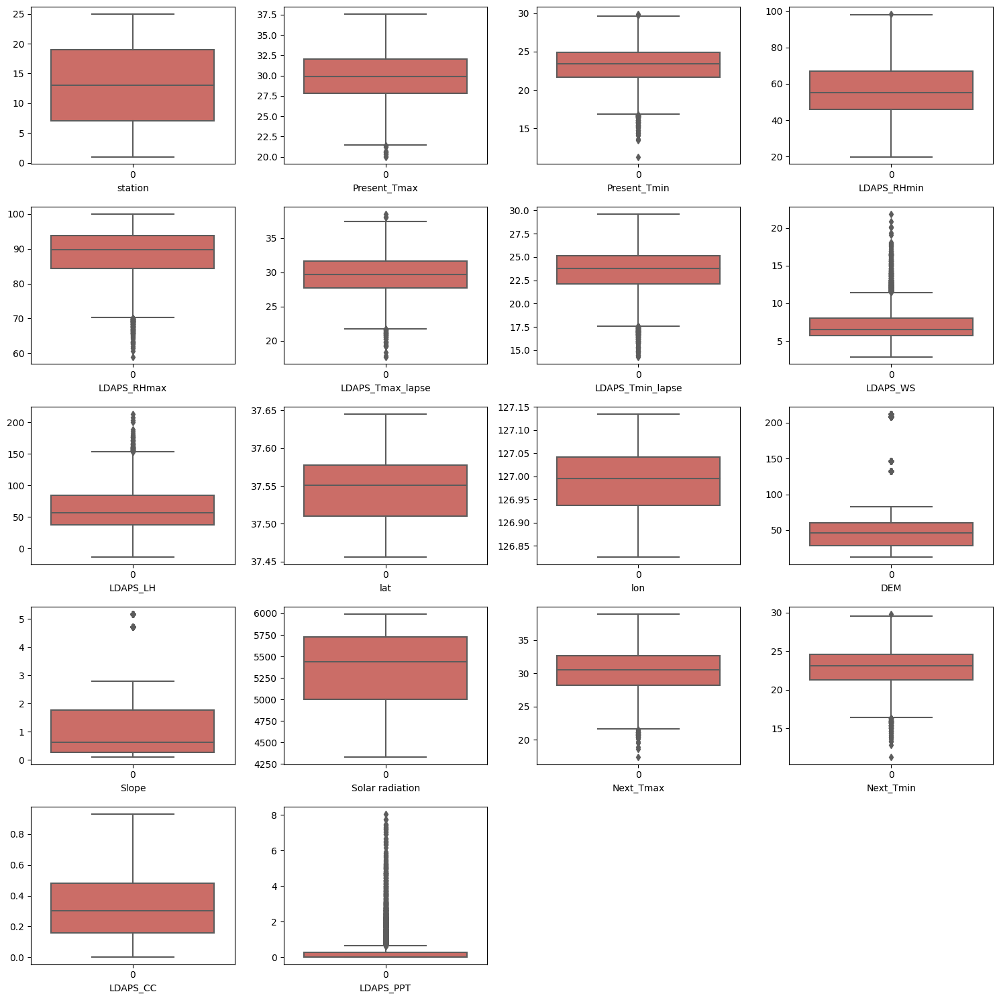

In [69]:
# Checking for outliers using boxplot
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 18:
        ax = plt.subplot(5, 4, plot_num)
        sns.boxplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

The columns with several outliers are: Present_Tmax, Present_Tmin, LDAPS_RHmax, LDAPS_Tmax_lapse, LDAPS_Tmin_lapse, LDAPS_WS, LDAPS_LH, DEM, Slope, and LDAPS_PPT. Since, we are predicting Next_Tmax and Next_Tmin, we will not remove outliers from these columns.<br>
The outliers can be removed using Z-score method or IQR method depending on data loss percentage with both the methods.

In [70]:
df.drop(columns='Date', inplace=True)

Since Date is an ordinal variable, we cannot consider it for outlier removal

#### Z-score method

In [71]:
from scipy.stats import zscore

In [72]:
out_features = df[['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'DEM', 'Slope', 'LDAPS_PPT']]
z = np.abs(zscore(out_features))
z

,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,DEM,Slope,LDAPS_PPT
0,0.361918,0.760331,0.381609,0.526914,0.217804,0.125210,0.210322,2.769916,1.113817,0.426169
1,0.720639,0.677022,0.310119,0.079943,0.223267,0.645617,0.312373,0.315833,0.543011,0.426169
2,0.619149,0.031109,0.616433,0.162129,0.450918,0.439516,1.248404,0.526781,0.723950,0.426169
3,0.754469,0.072764,1.131571,0.030051,0.080841,0.664938,0.099164,0.298273,0.931274,0.426169
4,0.551490,0.552057,0.247298,0.171722,0.012067,0.625709,1.359716,0.494902,0.549286,0.426169
...,...,...,...,...,...,...,...,...,...,...
7745,2.256392,2.259903,1.414584,0.616206,2.235911,0.224782,1.575461,0.655844,0.500695,0.426169
7746,2.459371,2.426522,0.656055,0.994612,2.445695,0.610434,0.589185,0.735600,0.820913,0.426169
7747,2.188732,2.551486,1.329564,1.115131,2.033125,0.434578,0.288109,0.853069,0.804716,0.426169
7748,2.188732,2.301557,1.549618,0.890330,2.051213,0.252689,0.452519,0.821617,0.755906,0.426169


In [73]:
# Removing data where z-score is above 3 (threshold value) for normal distribution
df_z = df[(z<3).all(axis=1)]
df_z.shape

(7254, 18)

In [74]:
# Data loss percentage
old = df.shape[0]
new_z = df_z.shape[0]

(old - new_z)/old * 100

6.07276964910009

Data loss percentage is around 6.07% for Z-score method.

#### IQR method

In [75]:
q1 = out_features.quantile(0.25)
q3 = out_features.quantile(0.75)

iqr = q3 - q1

df_q = df[~((df < (q1 - 1.5*iqr))| (df > (q3 + 1.5*iqr))).any(axis=1)]

df_q.shape

(5005, 18)

In [76]:
# Data loss percentage
old = df.shape[0]
new_q = df_q.shape[0]

(old - new_q)/old * 100

35.193577625275154

Data loss percentage is around 35.19%, which is very very high. Normally, we consider data loss of less than 10% only.<br>

So, we will use the z-score method to remove outliers.

In [77]:
df = df_z

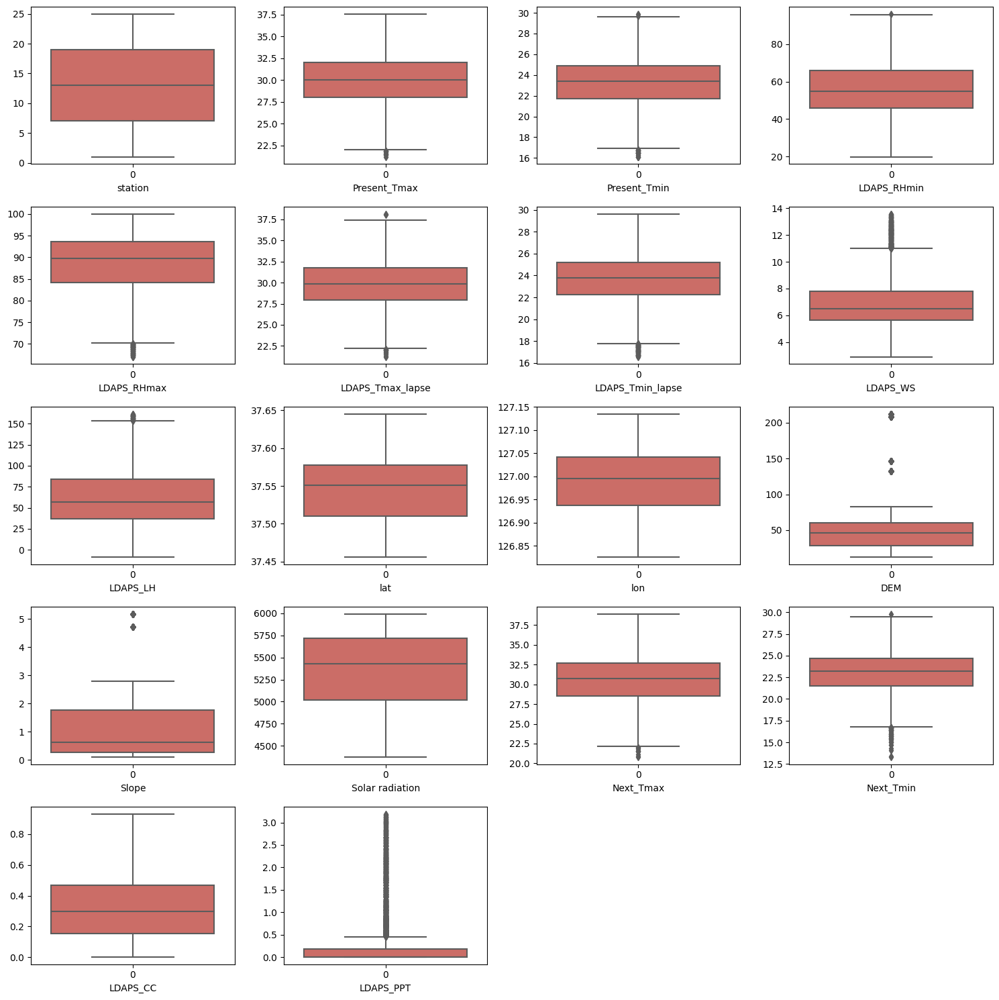

In [78]:
# Checking for outliers again using boxplot
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 18:
        ax = plt.subplot(5, 4, plot_num)
        sns.boxplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

There are fewer outliers in the dataset now. We should check and remove skewness.

After outlier removal, the data distribution looks like this.

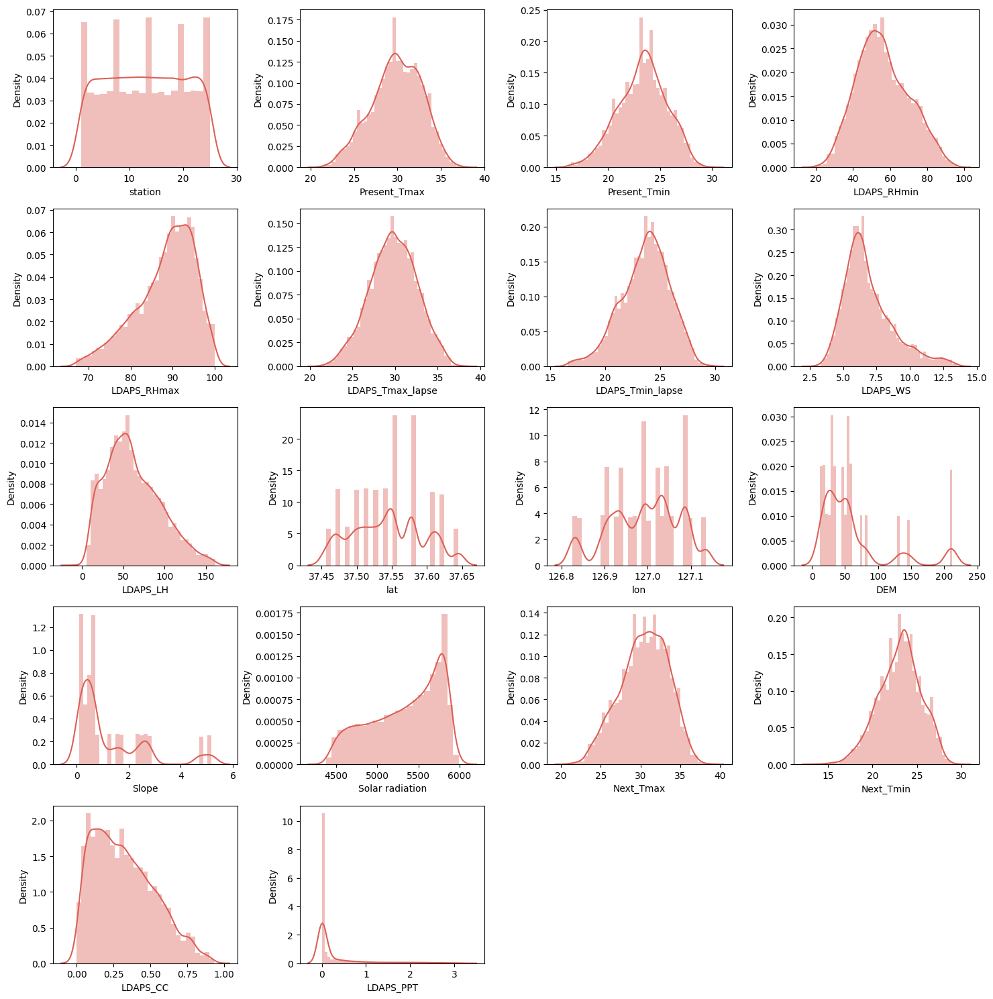

In [79]:
# Data distribution after outlier removal
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 18:
        ax = plt.subplot(5, 4, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

Now, we can remove the skewness to normalise the distribution.

### Checking for skewness

In [80]:
df.skew()

station            -0.001496
Present_Tmax       -0.254118
Present_Tmin       -0.220575
LDAPS_RHmin         0.277323
LDAPS_RHmax        -0.733981
LDAPS_Tmax_lapse   -0.096386
LDAPS_Tmin_lapse   -0.388449
LDAPS_WS            1.057192
LDAPS_LH            0.581667
lat                 0.105419
lon                -0.287859
DEM                 1.769316
Slope               1.597995
Solar radiation    -0.502190
Next_Tmax          -0.271839
Next_Tmin          -0.282791
LDAPS_CC            0.557289
LDAPS_PPT           2.658654
dtype: float64

The acceptable skewness range is between -0.5 to 0.5 (for extremely normal distributions)<br>
This means that LDAPS_RHmax, LDAPS_WS, LDAPS_LH, DEM, Slope, Solar radiation, LDAPS_CC, and LDAPS_PPT are all skewed.

In [81]:
#Importing extra libraries to remove skewness
from scipy import stats
from scipy import special

In [82]:
# Removing skewness
columns = ['LDAPS_RHmax', 'LDAPS_WS', 'LDAPS_LH', 'DEM', 'Slope', 'Solar radiation', 'LDAPS_CC', 'LDAPS_PPT']

skew_transform = {}

for col in columns:
    transformed_log = np.log(df[col])                        # Log Transformation
    transformed_boxcox = special.boxcox1p(df[col], 0.15)     # Box-Cox Transformation with lambda=0.15
    transformed_inverse = 1 / df[col]                        # Inverse Transformation
    transformed_yeojohnson, _ = stats.yeojohnson(df[col])    # Yeo-Johnson Transformation
    transformed_cbrt = np.cbrt(df[col])                      # Cube Root Transformation
    transformed_sqrt = np.sqrt(df[col])                      # Square Root Transformation

    # Creating a dictionary for the skewness values of each transformation
    transformed_skew = {
        "Log Transformation": stats.skew(transformed_log),
        "Box-Cox Transformation": stats.skew(transformed_boxcox),
        "Inverse Transformation": stats.skew(transformed_inverse),
        "Yeo Johnson Transformation": stats.skew(transformed_yeojohnson),
        "Cube Root Transformation": stats.skew(transformed_cbrt),
        "Square Root Transformation": stats.skew(transformed_sqrt)}

    # Storing the transformation skewness values for the column
    skew_transform[col] = transformed_skew

In [83]:
skew_transform_df = pd.DataFrame.from_dict(skew_transform)
skew_transform_df

,LDAPS_RHmax,LDAPS_WS,LDAPS_LH,DEM,Slope,Solar radiation,LDAPS_CC,LDAPS_PPT
Log Transformation,-0.917408,0.361557,NaN,0.420524,0.071556,-0.599680,-1.662978,NaN
Box-Cox Transformation,-0.887249,0.541723,NaN,0.685963,0.955234,-0.584823,0.332784,2.148581
Inverse Transformation,1.113055,0.370297,2.354531,1.055369,1.433251,0.700367,27.871702,NaN
Yeo Johnson Transformation,-0.107792,0.007945,-0.023889,0.038588,0.234971,-0.168300,0.049117,1.037155
Cube Root Transformation,-0.854934,0.595074,-0.278659,0.939782,0.626692,-0.566796,-0.399148,1.129187
Square Root Transformation,-0.824186,0.710947,NaN,1.178659,0.887994,-0.550485,-0.098574,1.622844


The Yeo Johnson transformation is the most suitable one for bringing the values in acceptable range of -0.5 to 0.5. For LDAPS PPT, the skewness is slightly above 1, which means it is moderately normal even after transformation

In [84]:
# Transforming using YeoJohnson
for col in columns:
    transformed_col, _ = stats.yeojohnson(df[col])
    df[col] = transformed_col

In [85]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,LDAPS_CC,LDAPS_PPT
0,1.0,28.7,21.4,58.255688,1.129906e+09,28.074101,23.006936,1.069090,15.292168,37.6046,126.991,2.843536,0.715918,1.438790e+17,29.1,21.2,0.154370,-0.0
1,2.0,31.9,21.6,52.263397,1.099100e+09,29.850689,24.035009,1.031964,12.945096,37.6046,127.032,2.391281,0.336102,1.304031e+17,30.5,22.5,0.160397,-0.0
2,3.0,31.6,23.3,48.690479,7.569707e+08,30.091292,24.565633,1.047875,7.456751,37.5776,127.058,2.283864,0.208920,1.298006e+17,31.1,23.9,0.168865,-0.0
3,4.0,32.0,23.4,58.239788,1.496598e+09,29.704629,23.326177,1.030378,14.819311,37.6450,127.022,2.398657,0.698455,1.291134e+17,31.7,24.3,0.155674,-0.0
4,5.0,31.4,21.9,56.174095,1.072588e+09,29.113934,23.486480,1.033580,19.605143,37.5507,127.135,2.302811,0.332410,1.293828e+17,31.2,22.5,0.157900,-0.0


These are the transformed values.

In [86]:
df.skew()

station            -0.001496
Present_Tmax       -0.254118
Present_Tmin       -0.220575
LDAPS_RHmin         0.277323
LDAPS_RHmax        -0.107815
LDAPS_Tmax_lapse   -0.096386
LDAPS_Tmin_lapse   -0.388449
LDAPS_WS            0.007946
LDAPS_LH           -0.023894
lat                 0.105419
lon                -0.287859
DEM                 0.038596
Slope               0.235019
Solar radiation    -0.168335
Next_Tmax          -0.271839
Next_Tmin          -0.282791
LDAPS_CC            0.049127
LDAPS_PPT           1.037370
dtype: float64

Now the skewness values are within the range of -0.5 to 0.5, except LDAPS_PPT. LDAPS_PPT has a skewness of 1.037 which is moderately normal.

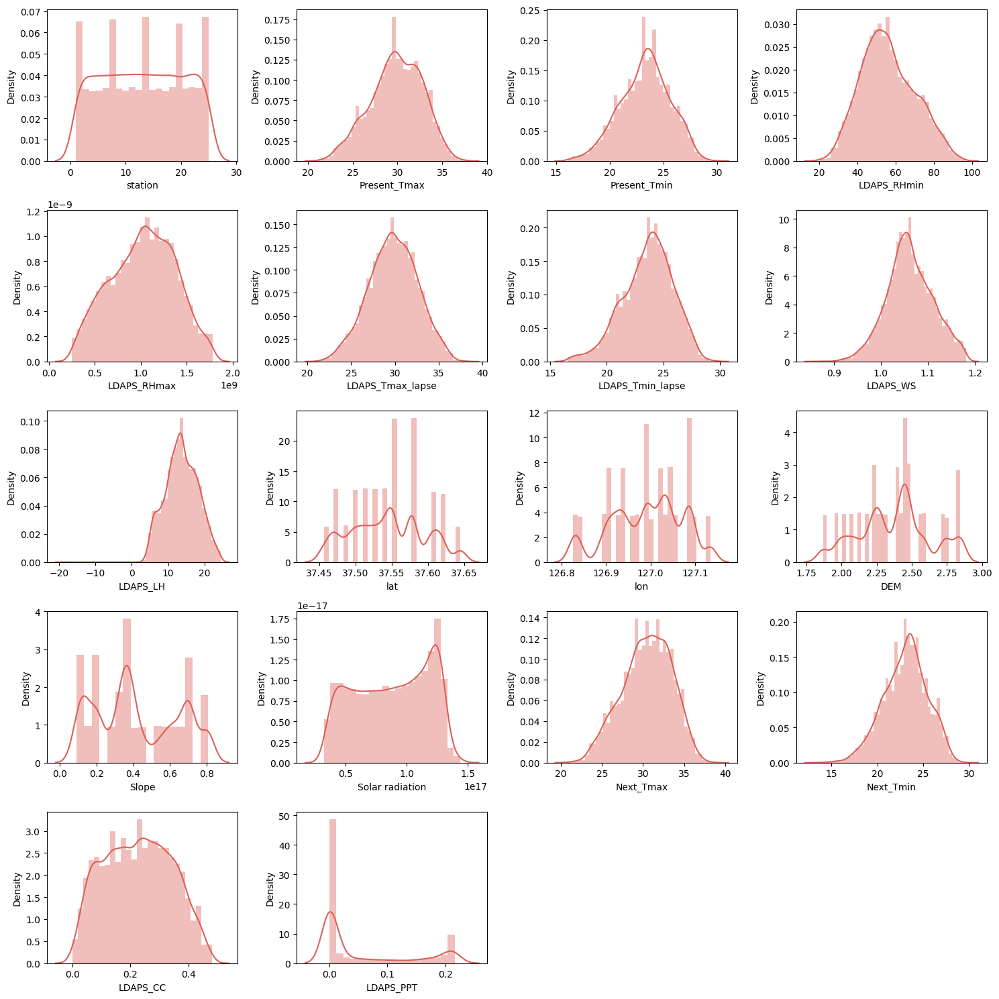

In [87]:
# Data distribution after data transformation
plt.figure(figsize=(15, 15))
plot_num = 1
for col in num_cols:
    if plot_num <= 18:
        ax = plt.subplot(5, 4, plot_num)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 10)
        plt.yticks(rotation = 0, fontsize = 10)
    plot_num+=1
plt.tight_layout()

As we can observe, the data is more normalised now.

### Correlation analysis

In [88]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,LDAPS_CC,LDAPS_PPT
station,1.000000,0.110154,0.132832,-0.067105,-0.176482,0.065622,0.103194,0.027901,-0.127803,-0.240114,-0.120973,-0.325870,-0.143431,-0.025746,0.105837,0.128100,0.009561,-0.002319
Present_Tmax,0.110154,1.000000,0.614377,-0.175623,-0.325700,0.542064,0.614063,-0.096690,0.115036,-0.048013,0.009404,-0.134812,-0.095713,-0.104846,0.592718,0.615931,-0.197529,-0.149009
Present_Tmin,0.132832,0.614377,1.000000,0.135165,-0.051959,0.428246,0.750424,0.024018,-0.008789,-0.073274,-0.042753,-0.241201,-0.161059,-0.057647,0.435992,0.782742,0.070888,0.070943
LDAPS_RHmin,-0.067105,-0.175623,0.135165,1.000000,0.576878,-0.570028,0.114278,0.199513,-0.017286,0.082561,-0.082919,0.055156,0.078560,0.230791,-0.437494,0.119698,0.727203,0.520434
LDAPS_RHmax,-0.176482,-0.325700,-0.051959,0.576878,1.000000,-0.412029,-0.163724,0.087269,0.271138,0.229395,0.012419,0.175233,0.208709,0.162765,-0.330019,-0.109268,0.330056,0.443589
LDAPS_Tmax_lapse,0.065622,0.542064,0.428246,-0.570028,-0.412029,1.000000,0.621341,-0.181229,0.017395,-0.032567,0.098000,-0.113051,-0.107382,-0.039931,0.808303,0.548828,-0.537428,-0.354999
LDAPS_Tmin_lapse,0.103194,0.614063,0.750424,0.114278,-0.163724,0.621341,1.000000,-0.028246,-0.140896,-0.088818,-0.026337,-0.175549,-0.161394,0.032828,0.547790,0.871595,0.044662,-0.012750
LDAPS_WS,0.027901,-0.096690,0.024018,0.199513,0.087269,-0.181229,-0.028246,1.000000,-0.053935,-0.024683,-0.076966,0.113715,0.095349,0.172117,-0.233327,0.005648,0.183405,0.236775
LDAPS_LH,-0.127803,0.115036,-0.008789,-0.017286,0.271138,0.017395,-0.140896,-0.053935,1.000000,0.097504,0.013618,0.048827,0.062974,-0.041135,0.146535,-0.056663,-0.210702,0.030431
lat,-0.240114,-0.048013,-0.073274,0.082561,0.229395,-0.032567,-0.088818,-0.024683,0.097504,1.000000,0.288002,0.032345,0.101510,0.036114,-0.045439,-0.078582,-0.016385,0.022850


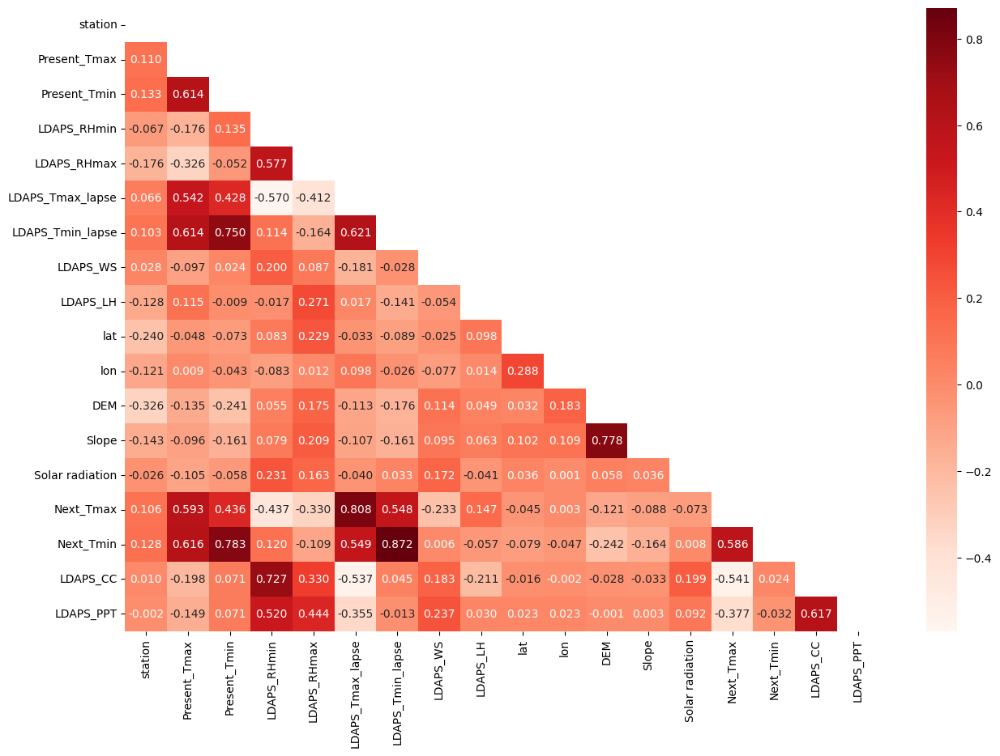

In [89]:
# Heatmap for correlation analysis
mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(15, 10))
sns.heatmap(df.corr(), annot=True, fmt='.3f', cmap='Reds', mask=mask)
plt.show()

Observations from the correlation heatmap:
- There seem to be a strong correlation between Next_Tmin and LDAPS_Tmin_lapse, Next_Tmax and LDAPS_Tmax_lapse, Next_Tmin and Present_Tmin, DEM and Slope, Present_Tmin and LDAPS_Tmin_lapse, LDAPS_RHmin and LDAPS_CC
- There are other moderate  relationships observed in the data.
The strong relationships will be handled during VIF evaluation for multicollinearity issues.

#### Correlation of other variables with Next_Tmin

In [90]:
df.corr()['Next_Tmin'].sort_values(ascending=False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.871595
Present_Tmin        0.782742
Present_Tmax        0.615931
Next_Tmax           0.586241
LDAPS_Tmax_lapse    0.548828
station             0.128100
LDAPS_RHmin         0.119698
LDAPS_CC            0.023939
Solar radiation     0.007569
LDAPS_WS            0.005648
LDAPS_PPT          -0.032259
lon                -0.047151
LDAPS_LH           -0.056663
lat                -0.078582
LDAPS_RHmax        -0.109268
Slope              -0.163761
DEM                -0.242427
Name: Next_Tmin, dtype: float64

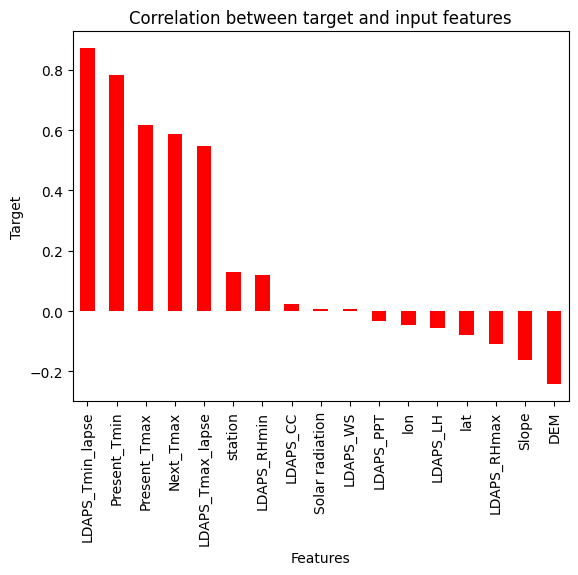

In [91]:
# Visualising the correlation between target (Next_Tmin) and input features
df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar', color='red')
plt.title('Correlation between target and input features')
plt.xlabel('Features')
plt.ylabel('Target')
plt.show()

LDAPS_Tmin_lapse, Present_Tmin, Present_Tmax, and Next_Tmax have the maximum correlation with Next_Tmin.

#### Correlation of other variables with Next_Tmax

In [92]:
df.corr()['Next_Tmax'].sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.808303
Present_Tmax        0.592718
Next_Tmin           0.586241
LDAPS_Tmin_lapse    0.547790
Present_Tmin        0.435992
LDAPS_LH            0.146535
station             0.105837
lon                 0.003131
lat                -0.045439
Solar radiation    -0.072703
Slope              -0.087849
DEM                -0.120568
LDAPS_WS           -0.233327
LDAPS_RHmax        -0.330019
LDAPS_PPT          -0.377420
LDAPS_RHmin        -0.437494
LDAPS_CC           -0.540714
Name: Next_Tmax, dtype: float64

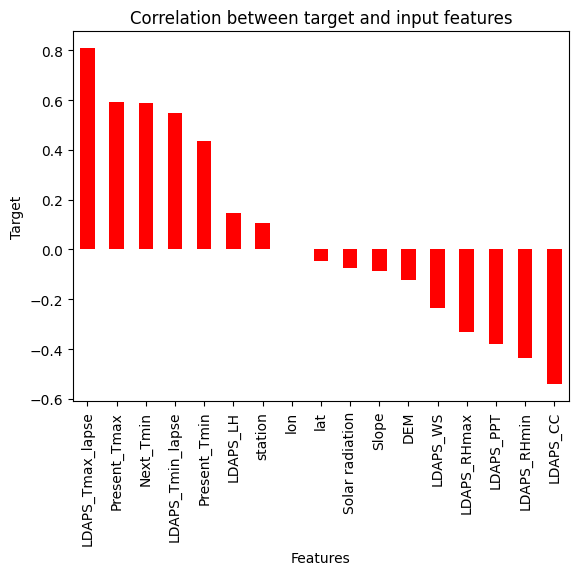

In [93]:
# Visualising the correlation between target (Next_Tmax) and input features
df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar', color='red')
plt.title('Correlation between target and input features')
plt.xlabel('Features')
plt.ylabel('Target')
plt.show()

LDAPS_Tmax_lapse, Present_Tmax, Next_Tmin, LDAPS_Tmin_lapse and LDAPS_CC have the maximum correlation with Next_Tmax.

## Part 1: Predicting Next_Tmin

### Separating features and target

In [94]:
x = df.drop(columns=['Next_Tmin', 'Next_Tmax'])
y = df['Next_Tmin']

#### Feature scaling

In [95]:
# Importing StandardScaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,lat,lon,DEM,Slope,Solar radiation,LDAPS_CC,LDAPS_PPT
0,-1.672634,-0.406581,-0.823205,0.145027,0.302157,-0.625165,-0.283792,0.146413,0.348695,1.211904,-0.005826,1.855666,1.331263,1.871136,-0.629040,-0.699827
1,-1.533754,0.703849,-0.737040,-0.281350,0.213496,0.015519,0.180872,-0.603854,-0.178670,1.211904,0.509910,0.069358,-0.372586,1.418410,-0.576611,-0.699827
2,-1.394873,0.599746,-0.004640,-0.535579,-0.771189,0.102287,0.420701,-0.282315,-1.411849,0.672177,0.836962,-0.354916,-0.943124,1.398167,-0.502950,-0.699827
3,-1.255993,0.738550,0.038443,0.143895,1.357536,-0.037154,-0.139503,-0.635897,0.242448,2.019494,0.384121,0.098489,1.252925,1.375082,-0.617695,-0.699827
4,-1.117113,0.530344,-0.607793,-0.003088,0.137190,-0.250174,-0.067050,-0.571195,1.317779,0.134450,1.805541,-0.280079,-0.389146,1.384133,-0.598328,-0.699827


### Checking Variance Inflation Factor (VIF)

In [96]:
# Checking for multicollinearity using Variance Inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_values = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = pd.DataFrame({'Features': x.columns, 'VIF': vif_values})
vif

,Features,VIF
0,station,1.287110
1,Present_Tmax,2.346267
2,Present_Tmin,2.874621
3,LDAPS_RHmin,5.439061
4,LDAPS_RHmax,2.305901
5,LDAPS_Tmax_lapse,6.569903
6,LDAPS_Tmin_lapse,6.352895
7,LDAPS_WS,1.159567
8,LDAPS_LH,1.403903
9,lat,1.289704


The VIF values should be below 5. Here, we can observe that VIF values exceeding 5. So we need to remove the column with highest VIF value to avoid multicollinearity.

In [97]:
x.drop(columns='LDAPS_Tmax_lapse', inplace=True)

In [98]:
vif_values = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = pd.DataFrame({'Features': x.columns, 'VIF': vif_values})
vif

,Features,VIF
0,station,1.286091
1,Present_Tmax,2.342141
2,Present_Tmin,2.874457
3,LDAPS_RHmin,3.296546
4,LDAPS_RHmax,2.301948
5,LDAPS_Tmin_lapse,2.901017
6,LDAPS_WS,1.149309
7,LDAPS_LH,1.383402
8,lat,1.280860
9,lon,1.195346


The VIF values are all within range now. So, we can proceed to build the model

### Model Building

In [99]:
# Importing required libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#### Splitting data into train and test

In [100]:
# Finding the best random state for splitting the data
max_accu = 0
max_rs = 0
for i in range(0, 100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=i)
    
    lr = LinearRegression()
    lr.fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    accu = r2_score(y_test, y_pred)
    if accu > max_accu:
        max_accu = accu
        max_rs = i
        
print(f'Best accuracy: {max_accu}\nRandom state for best accuracy: {max_rs}')

Best accuracy: 0.8314846349055729
Random state for best accuracy: 37


In [101]:
# Splitting into train-test data using best random state
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=max_rs)

#### Regression models

In [102]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
import xgboost

In [103]:
models = [
    ('Linear Regression', LinearRegression()),
    ('Support Vector Regressor', SVR()),
    ('KNN', KNeighborsRegressor()),
    ('Decision Tree', DecisionTreeRegressor()),
    ('Random Forest', RandomForestRegressor()),
    ('Extra Trees', ExtraTreesRegressor()),
    ('Gradient Boosting', GradientBoostingRegressor()),
    ('Lasso', Lasso()),
    ('Ridge', Ridge()),
    ('XGBoost', xgboost.XGBRegressor())
]

results = []

for model_name, model in models:
    
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    results.append((model_name, mae, rmse, r2))


df_results = pd.DataFrame(results, columns=['Model', 'MAE', 'RMSE', 'R2'])
df_results.sort_values('R2', ascending=False, inplace=True)

df_results

,Model,MAE,RMSE,R2
9,XGBoost,0.543045,0.717492,0.913891
5,Extra Trees,0.587891,0.781688,0.897793
4,Random Forest,0.597912,0.791106,0.895315
6,Gradient Boosting,0.657222,0.850641,0.878966
1,Support Vector Regressor,0.647403,0.866582,0.874387
0,Linear Regression,0.777609,1.003721,0.831485
8,Ridge,0.777631,1.003747,0.831476
2,KNN,0.825436,1.066865,0.809615
3,Decision Tree,0.852260,1.146660,0.780071
7,Lasso,1.252854,1.563515,0.591099


XGBoost Regressor model seems to have the best R2 score on the test data. The Lasso model has the least R2 score.

#### Cross validation

In [104]:
from sklearn.model_selection import cross_val_score

In [105]:
results = []

for model_name, model in models:
    cv_score = cross_val_score(model, x_train, y_train, cv=5, scoring='r2') # Using fold value of 5
    mean_score = cv_score.mean()
    
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    diff = abs(r2 - mean_score)
    
    results.append((model_name, mae, rmse, r2, mean_score, diff))


df_results = pd.DataFrame(results, columns=['Model', 'MAE', 'RMSE', 'R2', 'CV R2', 'Difference'])
df_results.sort_values('Difference', ascending=True, inplace=True)

df_results

,Model,MAE,RMSE,R2,CV R2,Difference
7,Lasso,1.252854,1.563515,0.591099,0.582074,0.009025
9,XGBoost,0.543045,0.717492,0.913891,0.903459,0.010432
5,Extra Trees,0.590666,0.782827,0.897495,0.886932,0.010563
4,Random Forest,0.599487,0.798378,0.893382,0.881085,0.012297
6,Gradient Boosting,0.656813,0.850112,0.879117,0.864983,0.014134
2,KNN,0.825436,1.066865,0.809615,0.795320,0.014295
1,Support Vector Regressor,0.647403,0.866582,0.874387,0.856649,0.017738
8,Ridge,0.777631,1.003747,0.831476,0.805469,0.026007
0,Linear Regression,0.777609,1.003721,0.831485,0.805468,0.026016
3,Decision Tree,0.852701,1.153165,0.777568,0.743770,0.033798


The Lasso model had the lowest performance from above so we need to discard it. Hence, XGBoost Regressor model has the least difference between cross validation R2 and test R2 scores. So it is the least overfitting model.

#### Hyperparameter tuning

In [106]:
from sklearn.model_selection import GridSearchCV

##### XGBoost

In [107]:
params = {
    'max_depth': [1, 2, 5, 7, 10, 50],
    'learning_rate': [0.001, 0.01, 0.1, 1.0],
    'subsample': [0.2, 0.5, 0.7, 1],
    'n_estimators': [10, 50, 100, 200, 400],
    'n_jobs' : [-2, -1, 1]
    }

In [108]:
gcv = GridSearchCV(xgboost.XGBRegressor(), params, cv=5, scoring='r2')
gcv.fit(x_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1.0],
                         'max_depth': [1, 2, 5, 7, 10, 50],
                         'n_estimators': [10, 50, 100, 200, 400],
                         'n_jobs': [-2, -1, 1],
                         'subsample': [0.2, 0.5, 0.7, 1]},
             scoring='r2')

In [109]:
best_params = gcv.best_params_
best_params

{'learning_rate': 0.1,
 'max_depth': 7,
 'n_estimators': 400,
 'n_jobs': -2,
 'subsample': 1}

In [110]:
model_xgb = xgboost.XGBRegressor(**best_params)
model_xgb.fit(x_train, y_train)
y_pred = model_xgb.predict(x_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Absolute Error: 0.4930408265388262
Root Mean Squared Error: 0.6524199419980048
R2 Score: 0.9288019481638419


The R2 score is 92.88%

### Saving the model

In [111]:
import pickle

In [112]:
filename = 'temperature_model.pkl'
pickle.dump(model_xgb, open(filename, 'wb'))

#### Predicting using the saved model

In [113]:
model = pickle.load(open(filename, 'rb'))

pred = model.predict(x_test)

In [114]:
test_df = pd.DataFrame({'Actual': np.array(y_test), 'Predicted': pred})
test_df

,Actual,Predicted
0,25.6,25.508736
1,28.3,27.585239
2,20.9,19.700096
3,22.5,23.059645
4,22.1,21.727236
...,...,...
1809,24.1,23.566280
1810,25.0,24.131577
1811,21.9,22.540497
1812,23.7,23.995506


#### Actual vs Predicted

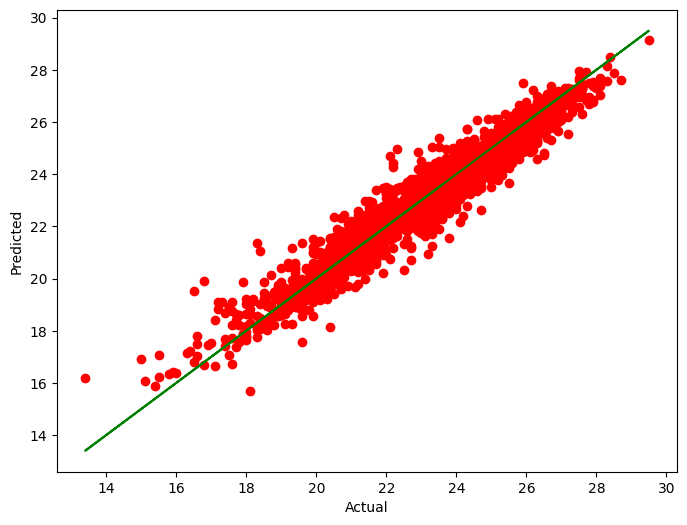

In [115]:
plt.figure(figsize=(8, 6))
plt.scatter(x=y_test, y=pred, color='r')
plt.plot(y_test, y_test, color='g')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

These are the final predictions.